# Project 6: preprocessing and clustering

In [1]:
import sys
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import random
import seaborn as sns
import os
import re
from time import time
from fonctions_eda import *
from sklearn.decomposition import PCA
import nltk
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.manifold import TSNE
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.cluster import KMeans, MiniBatchKMeans
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics.cluster import adjusted_rand_score
from gensim.models.word2vec import Word2Vec
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from gensim.models import KeyedVectors
import gensim.downloader as gensim_api
import gensim
import json
import cv2
import plotly.graph_objs as go
import plotly.express as px
import glob

In [2]:
import tensorflow as tf

In [3]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  0


This project was made with Python 3.8.10, **Matplotlib 3.4.2**, Pandas 1.1.3, Numpy 1.19.2, Seaborn 0.11.0., gensim 3.8.3, tensorflow 2.3.0. Chek your version number:

In [4]:
print("Python", sys.version_info.major, ".", sys.version_info.minor)
print("Matplotlib", mpl.__version__)
print("Pandas", pd.__version__)
print("Nympy", np.__version__)
print("Seaborn", sns.__version__)
print("Gensim", gensim.__version__)
print("Tensorflow", tf.__version__)

Python 3 . 8
Matplotlib 3.4.2
Pandas 1.1.3
Nympy 1.19.2
Seaborn 0.11.0
Gensim 3.8.3
Tensorflow 2.3.0


In [5]:
# For a better visualisation:
pd.set_option("display.max_columns", 200)
pd.set_option("display.max_rows", 200)
pd.set_option('display.float_format', '{:.2f}'.format)
plt.rcParams.update({"figure.titlesize":16, "axes.titlesize":15, "axes.labelsize":14, "xtick.labelsize":14, 
    "ytick.labelsize":14})

## Load dataset

Add the path to the file containing the .csv files of the project:

In [6]:
path_to_txt_folder = ""
path_to_images_folder = "images/"

In [7]:
path_txt = os.path.join(path_to_txt_folder, "flipkart_com-ecommerce_sample_1050.csv")

In [8]:
txt = pd.read_csv(path_txt, encoding="utf-8", parse_dates=[1])

## Quick view and basic info

In [9]:
txt.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56+00:00,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.00,899.00,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56+00:00,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.00,449.00,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56+00:00,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,nan,nan,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52+00:00,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.00,1299.00,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52+00:00,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.00,698.00,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [10]:
txt.loc[0, "product_url"]

'http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z'

In [11]:
print(f'File has {txt.shape[0]} lines and {txt.shape[1]} columns.')

File has 1050 lines and 15 columns.


In [12]:
txt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype              
---  ------                   --------------  -----              
 0   uniq_id                  1050 non-null   object             
 1   crawl_timestamp          1050 non-null   datetime64[ns, UTC]
 2   product_url              1050 non-null   object             
 3   product_name             1050 non-null   object             
 4   product_category_tree    1050 non-null   object             
 5   pid                      1050 non-null   object             
 6   retail_price             1049 non-null   float64            
 7   discounted_price         1049 non-null   float64            
 8   image                    1050 non-null   object             
 9   is_FK_Advantage_product  1050 non-null   bool               
 10  description              1050 non-null   object             
 11  product_rating           1050 

In [13]:
print(f'There are {txt.brand.unique().shape[0]} unique brands.')

There are 491 unique brands.


Examples of textual data:

In [14]:
# Examples of products names
txt.loc[0:10, "product_name"]

0     Elegance Polyester Multicolor Abstract Eyelet ...
1                            Sathiyas Cotton Bath Towel
2                   Eurospa Cotton Terry Face Towel Set
3     SANTOSH ROYAL FASHION Cotton Printed King size...
4     Jaipur Print Cotton Floral King sized Double B...
5     Maserati Time R8851116001 Analog Watch  - For ...
6     Camerii WM64 Elegance Analog Watch  - For Men,...
7     T STAR UFT-TSW-005-BK-BR Analog Watch  - For Boys
8     Alfajr WY16B Youth Digital Watch  - For Men, Boys
9     TAG Heuer CAU1116.BA0858 Formula 1 Analog Watc...
10    Calibro SW-125 Analog-Digital Watch  - For Men...
Name: product_name, dtype: object

In [15]:
# Examples of category trees:
txt.loc[0:10, "product_category_tree"]

0     ["Home Furnishing >> Curtains & Accessories >>...
1     ["Baby Care >> Baby Bath & Skin >> Baby Bath T...
2     ["Baby Care >> Baby Bath & Skin >> Baby Bath T...
3     ["Home Furnishing >> Bed Linen >> Bedsheets >>...
4     ["Home Furnishing >> Bed Linen >> Bedsheets >>...
5     ["Watches >> Wrist Watches >> Maserati Time Wr...
6     ["Watches >> Wrist Watches >> Camerii Wrist Wa...
7     ["Watches >> Wrist Watches >> T STAR Wrist Wat...
8     ["Watches >> Wrist Watches >> Alfajr Wrist Wat...
9     ["Watches >> Wrist Watches >> TAG Heuer Wrist ...
10    ["Watches >> Wrist Watches >> Calibro Wrist Wa...
Name: product_category_tree, dtype: object

In [16]:
# Examples of description:
txt.loc[0, "description"]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [17]:
# Examples of product specification:
txt.loc[0, "product_specifications"]

'{"product_specification"=>[{"key"=>"Brand", "value"=>"Elegance"}, {"key"=>"Designed For", "value"=>"Door"}, {"key"=>"Type", "value"=>"Eyelet"}, {"key"=>"Model Name", "value"=>"Abstract Polyester Door Curtain Set Of 2"}, {"key"=>"Model ID", "value"=>"Duster25"}, {"key"=>"Color", "value"=>"Multicolor"}, {"key"=>"Length", "value"=>"213 cm"}, {"key"=>"Number of Contents in Sales Package", "value"=>"Pack of 2"}, {"key"=>"Sales Package", "value"=>"2 Curtains"}, {"key"=>"Material", "value"=>"Polyester"}]}'

Many info are formated as strings, category tress are inside a list and product specification seems made to be extracted as a dict (although it if formated as string).

In [18]:
nan_col(txt)

,% NaN,% dispo
uniq_id,0.00,100.00
crawl_timestamp,0.00,100.00
product_url,0.00,100.00
product_name,0.00,100.00
product_category_tree,0.00,100.00
pid,0.00,100.00
retail_price,0.10,99.90
discounted_price,0.10,99.90
image,0.00,100.00
is_FK_Advantage_product,0.00,100.00


Most columns are full, only one line has missing info and brand is not always specified.

In [19]:
txt.describe()

,retail_price,discounted_price
count,1049.00,1049.00
mean,2186.20,1584.53
std,7639.23,7475.10
min,35.00,35.00
25%,555.00,340.00
50%,999.00,600.00
75%,1999.00,1199.00
max,201000.00,201000.00


In [20]:
pd.DataFrame({"retail_normal":txt.retail_price, "discounted_normal":txt.discounted_price, 
            "retail_log":np.log(txt.retail_price), "dicounted_log":np.log(txt.discounted_price)})

,retail_normal,discounted_normal,retail_log,dicounted_log
0,1899.00,899.00,7.55,6.80
1,600.00,449.00,6.40,6.11
2,nan,nan,nan,nan
3,2699.00,1299.00,7.90,7.17
4,2599.00,698.00,7.86,6.55
...,...,...,...,...
1045,1399.00,999.00,7.24,6.91
1046,4930.00,1896.00,8.50,7.55
1047,4500.00,1449.00,8.41,7.28
1048,3465.00,1333.00,8.15,7.20


In [21]:
# Get log values of numerical variables:
x_values = pd.DataFrame({"retail_normal":txt.retail_price, "discounted_normal":txt.discounted_price, 
                        "retail_log":np.log(txt.retail_price), "dicounted_log":np.log(txt.discounted_price)})

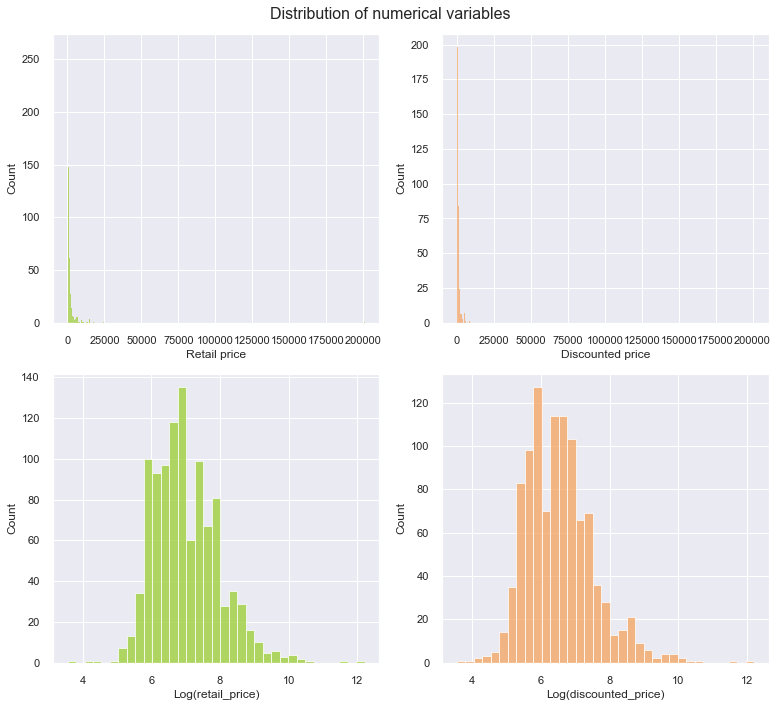

In [22]:
sns.set_theme(style="darkgrid")
fig, ax = plt.subplots(2, 2, figsize=(11, 10), tight_layout=True)
fig.suptitle("Distribution of numerical variables")

axes = [(0, 0), (0, 1), (1, 0), (1, 1)]
cols_data = ["retail_price", "discounted_price"] * 2
cols_x = ["retail_normal", "discounted_normal",  "retail_log", "dicounted_log"]
xlabs = ["Retail price", "Discounted price", "Log(retail_price)", "Log(discounted_price)"]
colors=["yellowgreen", "sandybrown"] * 2

for axe, x_value, col_data, col_x, xlab, color in zip(axes, x_values, cols_data, cols_x, xlabs, colors):
    sns.histplot(ax=ax[axe], data=x_values, x=col_x, color=color)
    ax[axe].set_xlabel(xlab)

#fig.savefig("fig/distrib_prices.png", bbox_inches="tight", dpi=150);

In [23]:
plt.rcParams.update({"figure.titlesize":16, "axes.titlesize":15, "axes.labelsize":14, "xtick.labelsize":14, 
    "ytick.labelsize":14})

Text(0, 0.5, 'Count')

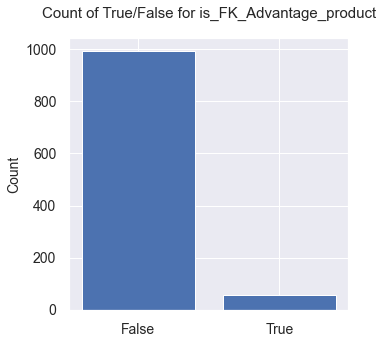

In [24]:
fig, ax = plt.subplots(figsize=(5, 5))

data = txt.is_FK_Advantage_product.value_counts()

ax.bar(height=data.values, x=data.index, tick_label=data.index)
ax.set_title("Count of True/False for is_FK_Advantage_product", pad=20)
#ax.set_xticks(["False", "True"])
ax.set_ylabel("Count")

#fig.savefig("fig/fk_var_count.png", bbox_inches="tight", dpi=150);

In [25]:
crawl_timestamp_d = txt.groupby(pd.Grouper(key='crawl_timestamp', freq='D')).count()["uniq_id"]

Text(0, 0.5, 'Count')

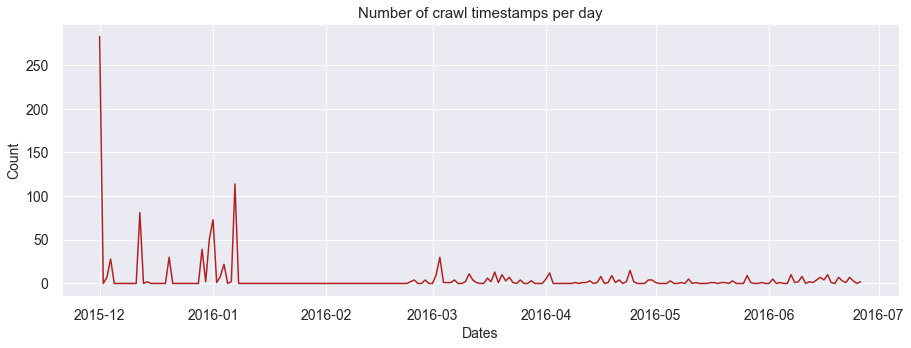

In [26]:
fig, ax = plt.subplots(figsize=(15, 5))

ax.plot(crawl_timestamp_d, color="firebrick")
ax.set_title("Number of crawl timestamps per day")
ax.set_xlabel("Dates")
ax.set_ylabel("Count")

#fig.savefig("fig/timestamps.png", bbox_inches="tight", dpi=150);

## Feature engineering

### Analysis of categories (for supervised learning)

In [27]:
txt.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56+00:00,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.00,899.00,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56+00:00,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.00,449.00,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56+00:00,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,nan,nan,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52+00:00,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.00,1299.00,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52+00:00,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.00,698.00,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [28]:
regexp_cat = '\[\"(?P<cat_1>[\w\s&,\']+)>>(?P<cat_2>[\w\s&,\']+)>*(?P<cat_3>[\w\s&,\']*).*'

In [29]:
def get_cat(text, regexp, name):

    """ Test a regexp on a text, if here is a mach return the stripped specified named group."""

    match = re.match(regexp, text)
    if match is None:
        pass
    else:
        return match.group(name).strip()

In [30]:
txt["level_1"] = txt["product_category_tree"].apply(lambda x: get_cat(x, regexp_cat, 'cat_1'))
txt["level_2"] = txt["product_category_tree"].apply(lambda x: get_cat(x, regexp_cat, 'cat_2'))
txt["level_3"] = txt["product_category_tree"].apply(lambda x: get_cat(x, regexp_cat, 'cat_3'))

Objects categories for each level of the category tree:

In [31]:
print(f"There are {txt.level_1.unique().shape[0]} categories of first level.")
print(f"There are {txt.level_2.unique().shape[0]} categories of second level.")
print(f"There are {txt.level_3.unique().shape[0]} categories of third level.")

There are 7 categories of first level.
There are 62 categories of second level.
There are 242 categories of third level.


In [32]:
# Categories first level:
txt.level_1.unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

In [33]:
# Categories second level:
txt.level_2.unique()

array(['Curtains & Accessories', 'Baby Bath & Skin', 'Bed Linen',
       'Wrist Watches', 'Living Room Furnishing', 'Bath Linen',
       'Candles & Fragrances', 'Tableware & Cutlery', 'Lighting',
       'JMD Home Furnishing', 'Infant Wear', "Kripa's Home Furnishing",
       'Hair Care', 'Coffee Mugs', 'Network Components',
       'Tablet Accessories', 'Cookware', 'Laptop Accessories', 'Makeup',
       'Combos and Kits', 'Feeding & Nursing', 'Baby Bedding',
       'Kitchen & Dining Linen', 'Containers & Bottles',
       'Consumables & Disposables', 'Wall Decor & Clocks',
       'Table Decor & Handicrafts', 'Flowers, Plants & Vases', 'Software',
       'Showpieces', 'Furniture & Furnishings',
       'Decorative Lighting & Lamps', 'Baby Grooming',
       'Computer Peripherals', 'Cushions, Pillows & Covers', 'Storage',
       'Health Care', 'Body and Skin Care', 'Kitchen Tools',
       'TRUE Home Decor & Festive Needs', 'Living', 'Showpiece',
       'Bar & Glassware', 'Fragrances', "Women'

In [34]:
# Remplace empty strings by "Unknown"
txt[["level_1", "level_2", "level_3"]] = txt[["level_1", "level_2", "level_3"]].replace("", "Unknown")

In [35]:
nan_col(txt)

,% NaN,% dispo
uniq_id,0.00,100.00
crawl_timestamp,0.00,100.00
product_url,0.00,100.00
product_name,0.00,100.00
product_category_tree,0.00,100.00
pid,0.00,100.00
retail_price,0.10,99.90
discounted_price,0.10,99.90
image,0.00,100.00
is_FK_Advantage_product,0.00,100.00


In [36]:
txt.groupby("level_1").count()["uniq_id"]

level_1
Baby Care                     150
Beauty and Personal Care      150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Kitchen & Dining              150
Watches                       150
Name: uniq_id, dtype: int64

There are 150 products for each level 1 category.

In [37]:
level_2_count = txt.groupby("level_2").count()["uniq_id"].copy()
level_2_count.sort_index(inplace=True)
level_2_count.sort_values(ascending=False, inplace=True)
level_2_count_30 = level_2_count[:30]

Text(0, 0.5, 'Count of products')

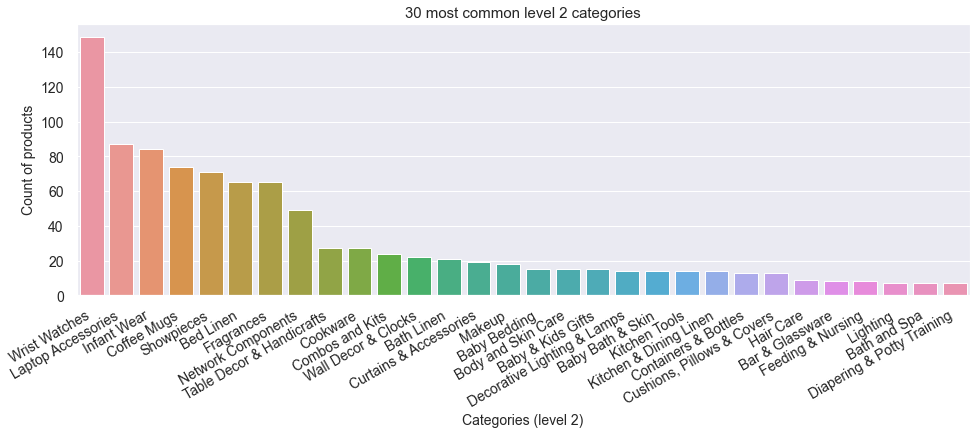

In [38]:
fig, ax = plt.subplots(figsize=(16, 5))

sns.barplot(ax=ax, y=level_2_count_30, x=level_2_count_30.index)
ax.set_xticks(range(0, 30))
ax.set_xticklabels(level_2_count_30.index, rotation=30, ha="right")
ax.set_title("30 most common level 2 categories")
ax.set_xlabel("Categories (level 2)")
ax.set_ylabel("Count of products")

#fig.savefig("fig/cat_lvl2.png", bbox_inches="tight", dpi=150);

Let's make a function to aggregate the text contained in the dataframe and corresponding to a specific category:

In [39]:
# Define stopwords to remove:
sw = nltk.corpus.stopwords.words('english') + ["inch", "com", "and", "cm", "thus"]

# Add some uninformative words:
uninformative_words = ["price", "cash", "delivery", "pack", "flipkart", "buy", "sale", "product", "feature",
    "print", "online", "free", "shipping", "ship"]
sw += uninformative_words

# Define stemmer
stemmer = nltk.stem.SnowballStemmer("english")

# Define lemmatizer:
lem = nltk.stem.WordNetLemmatizer()

In [40]:
def agg_pd_txt(df, col_cond, value, col_toagg):

    """ 
    Aggregate string values from a dataframe selected from a condition. Return a single string.
    df: dataframe containing the data.
    col_cond: (str) column to use in the selection condition.
    value: (str) value of the condition.
    col_toagg : column containing strings to aggregate.
    
    """
    result = df[df[col_cond]==value][col_toagg]
    result = result.agg("sum").lower()
    return result

In [41]:
def clean_non_words(text, lower=True):
    """Remove all non-alphabetical characters and 1-2 letters words, pass text to lower case if lower is set to True."""
    if lower:
        text = text.lower()
    else: pass
    # Select only words:
    text = re.sub("[^a-z]+", " ", text)
    # Only words of 3 characters or more:
    text = re.sub(r"\b\w{1}\b", "", text)
    text = re.sub(r"\b\w{2}\b", "", text)
    # Clean multiple whitespaces:
    text = re.sub(r" +", " ", text)
    text = text.strip()
    return text

In [42]:
def tokenize_clean_sw_stem(text, stopwords, stemmer):
    """Tokenize with simple split, remove stopwords, stem."""
    # Tokenize
    text = text.split()
    # Stemming
    text = [stemmer.stem(w) for w in text]
    # Remove stopwords
    text = [w for w in text if w not in stopwords]
    return text

In [43]:
def tokenize_clean_sw_lemmatize(text, stopwords, lemmatizer):
    """Tokenize with simple split, remove stopwords, lemmatize with tags."""
    # Tokenize
    text = text.split()

    # Tag text and lemmatize accordingly
    tagged_text = nltk.pos_tag(text)
    lemmatized_text=[]
    for word, tag in tagged_text:
        if tag.startswith('J'):
            lemmatized_text.append(lem.lemmatize(word,'a'))
        elif tag.startswith('V'):
            lemmatized_text.append(lem.lemmatize(word,'v'))
        elif tag.startswith('N'):
            lemmatized_text.append(lem.lemmatize(word,'n'))
        elif tag.startswith('R'):
            lemmatized_text.append(lem.lemmatize(word,'r'))
        else:
            lemmatized_text.append(lem.lemmatize(word))

    # Remove stopwords
    lemmatized_text = [w for w in lemmatized_text if w not in stopwords]

    return lemmatized_text

In [44]:
# Create dictionnaries that will contain corpus:
products_names = {"furnishing":"", "baby":"", "watches":"", "decor":"", 
    "kitchen":"", "beauty":"", "computers":""}

descriptions = {"furnishing":"", "baby":"", "watches":"", "decor":"", 
    "kitchen":"", "beauty":"", "computers":""}

# List categories:
categories = ["Home Furnishing", "Baby Care", "Watches", "Home Decor & Festive Needs", 
    "Kitchen & Dining", "Beauty and Personal Care", "Computers"]

Stemming give words whose meaning is not clear and may be misleading ("eleg", "singl", "enhanc"). We will rather use the lemmatizer that usually gives better results.

In [45]:
# Clean dictionnaries
products_names = {"furnishing":"", "baby":"", "watches":"", "decor":"", 
    "kitchen":"", "beauty":"", "computers":""}

descriptions = {"furnishing":"", "baby":"", "watches":"", "decor":"", 
    "kitchen":"", "beauty":"", "computers":""}

In [46]:
# Same steps but with lemmatizer:

for key, cat in zip(products_names.keys(), categories):
    products_names[key] = agg_pd_txt(txt,"level_1", cat, "product_name")
    products_names[key] = clean_non_words(products_names[key])
    products_names[key] = tokenize_clean_sw_lemmatize(products_names[key], sw, lem)

for key, cat in zip(descriptions.keys(), categories):
    descriptions[key] = agg_pd_txt(txt,"level_1", cat, "description")
    descriptions[key] = clean_non_words(descriptions[key])
    descriptions[key] = tokenize_clean_sw_lemmatize(descriptions[key], sw, lem)

In [47]:
descriptions["furnishing"]

['key',
 'elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'floral',
 'curtain',
 'elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'height',
 'curtain',
 'enhance',
 'look',
 'interior',
 'curtain',
 'make',
 'high',
 'quality',
 'polyester',
 'fabric',
 'eyelet',
 'style',
 'stitch',
 'metal',
 'ring',
 'make',
 'room',
 'environment',
 'romantic',
 'love',
 'curtain',
 'ant',
 'wrinkle',
 'anti',
 'shrinkage',
 'elegant',
 'apparance',
 'give',
 'home',
 'bright',
 'modernistic',
 'appeal',
 'design',
 'surreal',
 'attention',
 'sure',
 'steal',
 'heart',
 'contemporary',
 'eyelet',
 'valance',
 'curtain',
 'slide',
 'smoothly',
 'draw',
 'apart',
 'first',
 'thing',
 'morning',
 'welcome',
 'bright',
 'sun',
 'ray',
 'want',
 'wish',
 'good',
 'morning',
 'whole',
 'world',
 'draw',
 'close',
 'evening',
 'create',
 'special',
 'moment',
 'joyous',
 'beauty',
 'give',
 'soothe',
 'bring',
 'home',
 'elegant',

Words are quite well lemmatized. Compared to the stemming approach, "eleg" is now "elegance", "enhanc" become "enhance", etc...

In [48]:
descriptions_freq = dict()
total, unique = [], []

for k, v in zip(descriptions.keys(), descriptions.values()):
    descriptions_freq[k] = fq =  nltk.FreqDist(v)
    total.append(len(v))
    unique.append(len(fq.keys()))

descriptions_n_words = pd.DataFrame({"total":total, "unique":unique}, index=descriptions.keys())
descriptions_n_words.sort_values(by="total", ascending=False, inplace=True)

In [49]:
products_names_freq = dict()
total, unique = [], []

for k, v in zip(products_names.keys(), products_names.values()):
    products_names_freq[k] = fq =  nltk.FreqDist(v)
    total.append(len(v))
    unique.append(len(fq.keys()))

products_names_n_words = pd.DataFrame({"total":total, "unique":unique}, index=descriptions.keys())
products_names_n_words.sort_values(by="total", ascending=False, inplace=True)

In [50]:
descriptions_n_words

,total,unique
kitchen,8835,1143
baby,7759,1208
decor,7629,1447
computers,7625,1017
furnishing,5191,816
beauty,4966,1165
watches,4040,475


In [51]:
products_names_n_words

,total,unique
beauty,878,446
decor,814,413
computers,783,321
baby,741,352
furnishing,718,247
watches,683,221
kitchen,645,329


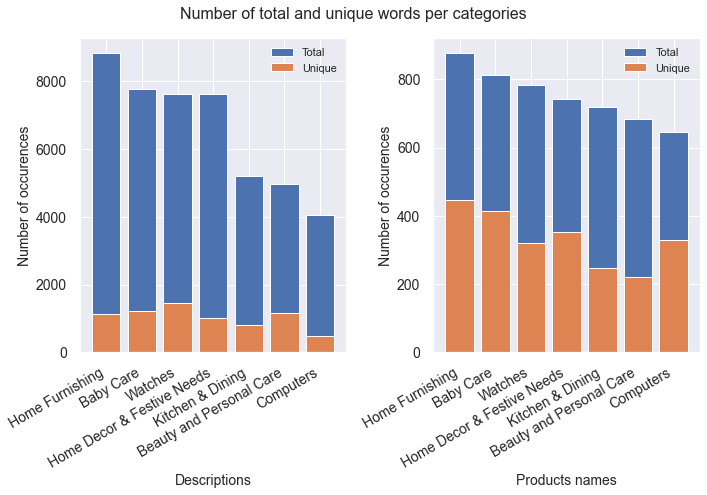

In [52]:
fig, ax = plt.subplots (1, 2, figsize=(10, 7), tight_layout=True)
fig.suptitle("Number of total and unique words per categories")

datas = [descriptions_n_words, products_names_n_words]
xlabels = ["Descriptions", "Products names"]

for axe, data, xlab in zip([0, 1], datas, xlabels):
    ax[axe].bar(height=data["total"], x=categories, label="Total")
    ax[axe].bar(height=data["unique"], x=categories, label="Unique")
    ax[axe].set_ylabel("Number of occurences")
    ax[axe].set_xlabel(xlab)
    ax[axe].set_xticks(categories)
    ax[axe].set_xticklabels(categories, rotation=30, ha="right")
    ax[axe].legend()

#fig.savefig("fig/nb_words_cat.png", bbox_inches="tight", dpi=150);

In [53]:
furnishing_desc_freq = pd.Series(descriptions_freq["furnishing"])
furnishing_desc_freq.sort_values(ascending=False, inplace=True)

furnishing_names_freq = pd.Series(products_names_freq["furnishing"])
furnishing_names_freq.sort_values(ascending=False, inplace=True)

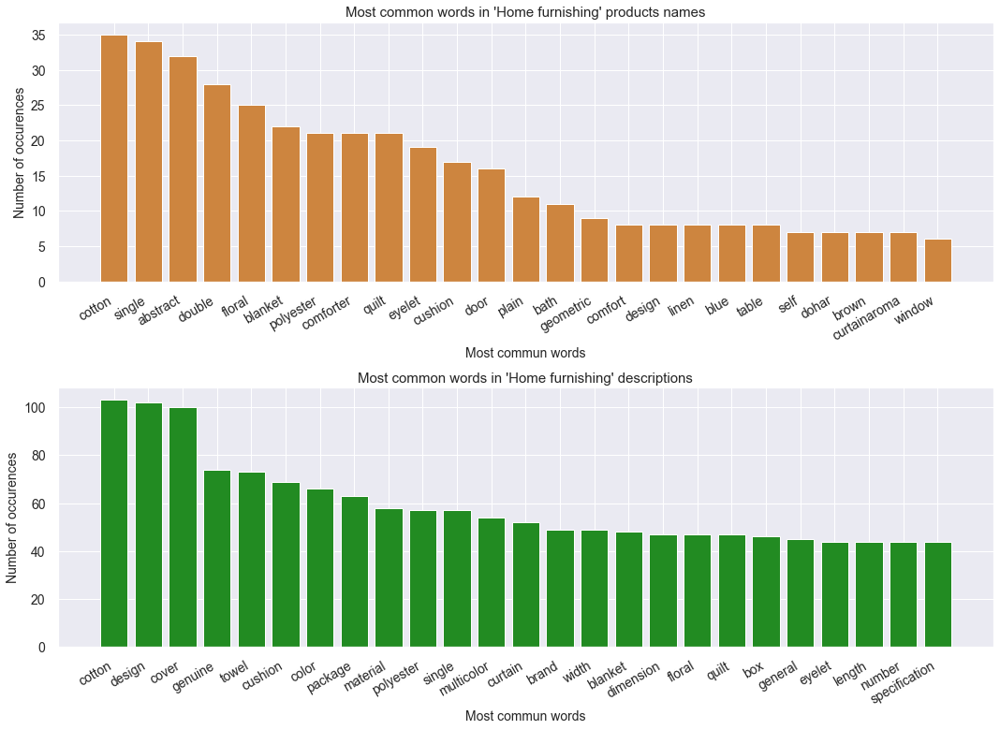

In [54]:
fig, ax = plt.subplots(2, 1, figsize=(15, 11), tight_layout=True)
datas = [furnishing_names_freq, furnishing_desc_freq]
titles = ["Most common words in 'Home furnishing' products names", "Most common words in 'Home furnishing' descriptions"]
xlabels = ["Products names", "Descriptions"]
colors = ["peru", "forestgreen"]

for axe, data, title, xlab, color in zip([0, 1], datas, titles, xlabels, colors):
    ax[axe].bar(height=data[:25], x=data[:25].index, color=color)
    ax[axe].set_title(title)
    ax[axe].set_ylabel("Number of occurences")
    ax[axe].set_xlabel("Most commun words")
    ax[axe].set_xticks(data[:25].index)
    ax[axe].set_xticklabels(data[:25].index, rotation=30, ha="right")

#fig.savefig("fig/common_words_furnishing.png", bbox_inches="tight", dpi=150);

### Whole dataset analysis (for unsupervised learning)

We will use both product name and text description in order to maximise the informative value of our texts.

In [55]:
# Aggregate product names and descriptions in a new column:
txt["name_description"] = txt["product_name"] + txt["description"]

In [56]:
# Keep only relevant columns for text analysis:
txt_clean = txt[["image", "product_name", "description", "level_1", "level_2", "level_3", "name_description"]].copy()
txt_clean.head()

,image,product_name,description,level_1,level_2,level_3,name_description
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,Home Furnishing,Curtains & Accessories,Curtains,Elegance Polyester Multicolor Abstract Eyelet ...
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,Baby Care,Baby Bath & Skin,Baby Bath Towels,Sathiyas Cotton Bath TowelSpecifications of Sa...
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,Baby Care,Baby Bath & Skin,Baby Bath Towels,Eurospa Cotton Terry Face Towel SetKey Feature...
3,d4684dcdc759dd9cdf41504698d737d8.jpg,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,Home Furnishing,Bed Linen,Bedsheets,SANTOSH ROYAL FASHION Cotton Printed King size...
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,Home Furnishing,Bed Linen,Bedsheets,Jaipur Print Cotton Floral King sized Double B...


Example on a few sentences on the first document of text preprocessing:

In [126]:
# Raw text
txt_example = txt.loc[0, "name_description"]
txt_example

'Elegance Polyester Multicolor Abstract Eyelet Door CurtainKey Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant 

In [127]:
# Pass to lower case, remove numbers and less than 3 letters words
txt_example = clean_non_words(txt_example)
txt_example

'elegance polyester multicolor abstract eyelet door curtainkey features elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain height pack price this curtain enhances the look the interiors this curtain made from high quality polyester fabric features eyelet style stitch with metal ring makes the room environment romantic and loving this curtain ant wrinkle and anti shrinkage and have elegant apparance give your home bright and modernistic appeal with these designs the surreal attention sure steal hearts these contemporary eyelet and valance curtains slide smoothly when you draw them apart first thing the morning welcome the bright sun rays you want wish good morning the whole world and when you draw them close the evening you create the most special moments joyous beauty given the soothing prints bring home the elegant curtain that softly filters light your room that you get the right amount sunlight specifi

In [128]:
# After removing stopwords, stemming and tokenizing:
txt_example_stem = tokenize_clean_sw_stem(txt_example, sw, stemmer)
txt_example_stem

['eleg',
 'polyest',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtainkey',
 'featur',
 'eleg',
 'polyest',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'floral',
 'curtain',
 'eleg',
 'polyest',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'height',
 'curtain',
 'enhanc',
 'look',
 'interior',
 'curtain',
 'made',
 'high',
 'qualiti',
 'polyest',
 'fabric',
 'featur',
 'eyelet',
 'style',
 'stitch',
 'metal',
 'ring',
 'make',
 'room',
 'environ',
 'romant',
 'love',
 'curtain',
 'ant',
 'wrinkl',
 'anti',
 'shrinkag',
 'eleg',
 'appar',
 'give',
 'home',
 'bright',
 'modernist',
 'appeal',
 'design',
 'surreal',
 'attent',
 'sure',
 'steal',
 'heart',
 'contemporari',
 'eyelet',
 'valanc',
 'curtain',
 'slide',
 'smooth',
 'draw',
 'apart',
 'first',
 'thing',
 'morn',
 'welcom',
 'bright',
 'sun',
 'ray',
 'want',
 'wish',
 'good',
 'morn',
 'whole',
 'world',
 'draw',
 'close',
 'even',
 'creat',
 'special',
 'moment',
 'joyous',
 'beauti',
 

In [129]:
# After removing stopwords, lemmatizing and tokenizing:
txt_example_lem = tokenize_clean_sw_lemmatize(txt_example, sw, lem)
txt_example_lem

['elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtainkey',
 'elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'floral',
 'curtain',
 'elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'height',
 'curtain',
 'enhance',
 'look',
 'interior',
 'curtain',
 'make',
 'high',
 'quality',
 'polyester',
 'fabric',
 'eyelet',
 'style',
 'stitch',
 'metal',
 'ring',
 'make',
 'room',
 'environment',
 'romantic',
 'love',
 'curtain',
 'ant',
 'wrinkle',
 'anti',
 'shrinkage',
 'elegant',
 'apparance',
 'give',
 'home',
 'bright',
 'modernistic',
 'appeal',
 'design',
 'surreal',
 'attention',
 'sure',
 'steal',
 'heart',
 'contemporary',
 'eyelet',
 'valance',
 'curtain',
 'slide',
 'smoothly',
 'draw',
 'apart',
 'first',
 'thing',
 'morning',
 'welcome',
 'bright',
 'sun',
 'ray',
 'want',
 'wish',
 'good',
 'morning',
 'whole',
 'world',
 'draw',
 'close',
 'evening',
 'create',
 'special',
 

In [130]:
# Make a vocabulary set on the whole corpus using our cleaning/tokenizing/lemmatizing functions:
vocabulary = txt["name_description"].agg("sum").lower()
vocabulary = clean_non_words(vocabulary)
vocabulary = tokenize_clean_sw_lemmatize(vocabulary, sw, lem)
#vocabulary = set(vocabulary)

In [131]:
whole_corpus_fq = nltk.FreqDist(vocabulary)
whole_corpus_fq = pd.Series(whole_corpus_fq)
whole_corpus_fq.sort_values(ascending=False, inplace=True)

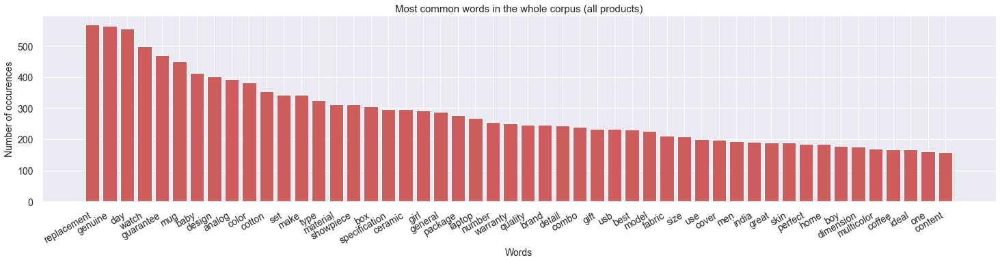

In [132]:
fig, ax = plt.subplots(figsize=(25, 5))

ax.bar(height=whole_corpus_fq[:50], x=whole_corpus_fq[:50].index, color="indianred")
ax.set_title("Most common words in the whole corpus (all products)")
ax.set_xlabel("Words")
ax.set_ylabel("Number of occurences")
ax.set_xticks(whole_corpus_fq[:50].index)
ax.set_xticklabels(whole_corpus_fq[:50].index, rotation=30, ha="right");

#fig.savefig("fig/common_words_corpus.png", bbox_inches="tight", dpi=150);

In [133]:
# Make copies of our corpus
corpus = txt["name_description"].to_numpy().copy()
corpus_series = txt["name_description"].copy()

In [134]:
clean_corpus = []
for document in corpus:
    document = clean_non_words(document)
    document = tokenize_clean_sw_lemmatize(document, sw, lem)
    clean_corpus.append(document)

### Bag of words

Our first approach is to use a bag of words for each document (product name + description) of the corpus.

We will use our own preprocessing from the functions defined above. We will limitate our BoW to 2500 words (`max_features`).

In [135]:
# Define our preprocessing function:
def txt_preprocessing(text):
    """
    Clean non-words (that include numbers or punctuation and are less than 3 letters).
    Pass text to lower case, tokenize, remove stopwords, lemmatize with tagging.
    """
    text = clean_non_words(text)
    text = tokenize_clean_sw_lemmatize(text, sw, lem)
    return text

In [136]:
# Define count vectorizer to create sparse matrix and fit it:
cv = CountVectorizer(analyzer=txt_preprocessing, max_features=2500)
bow_matrix = cv.fit_transform(corpus).toarray()
# Check shape
bow_matrix.shape

(1050, 2500)

In [137]:
# Get words and make a dataframe for readability:
bow_df = pd.DataFrame(bow_matrix, columns=cv.get_feature_names())
bow_df.head()

,aapno,aari,ability,abkl,able,abode,absorb,absorbency,absorbent,abstract,accent,accessory,accord,aci,acne,across,acrylic,act,actual,adaa,adapter,adapterkey,adaptor,add,addition,additional,adf,adhesive,adi,adidas,adjustable,admire,adorable,adorn,adsl,advance,advice,aero,affect,affordable,age,agrasen,agromech,aid,air,airtex,akada,akshaj,akup,alarm,aleo,alfajr,allin,allow,alloy,ally,almond,aloe,aloevera,along,also,aluminium,always,amaze,amazing,amazwh,amit,ammonia,amount,amplify,analog,andre,andriod,android,angel,animal,anjalika,anna,anodise,anodize,another,ant,anti,antibacterial,antique,antiqueshop,anywhere,apart,apex,apl,apollo,app,apparel,appeal,appearance,apple,application,applique,apply,approach,...,washable,watch,watche,watchsonata,water,waterproof,wave,way,wealth,wear,weave,web,wed,wedding,week,weight,welcome,weldecor,welhouse,well,west,western,wet,wglass,wheel,wher,whereas,wherever,whether,white,whitebuy,whiteherbs,whole,wht,wide,widely,width,wild,win,wind,window,windows,windsor,wine,winger,wink,winner,winter,wipe,wire,wireless,wish,within,without,wok,woman,womenmaxima,womensonata,womenspecifications,womentimes,womentimewel,wonderchef,wonderful,wood,wooden,woodino,woody,wool,work,workmanship,world,worry,would,woven,wow,wrap,wrapped,wrapper,wrinkle,wrist,xyz,yardley,yarn,ybscr,year,yellow,yes,yet,ygs,york,young,youth,youthful,yuva,zero,zingalalaa,zipper,zone,zora,zyxel
0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


As expected, we get a very sparse matrix of 1050 lines (products) x 2500 columns (words).

### Tf-idf

#### Tf-idf with min_df parameter set

We will use tf-idf method to extract features from our texts and get a matrix that we will use in a t-SNE visualization (therefore with dimensions reduction).

In [147]:
# Define our tf-idf vectorizer
vectoriser = TfidfVectorizer(analyzer=txt_preprocessing, min_df=0.0015)

In [148]:
# Fit-transform and get our tf_idf matrix
tf_idf_result = vectoriser.fit_transform(corpus)
tf_idf_df=pd.DataFrame(tf_idf_result.toarray(),columns=vectoriser.get_feature_names())
tf_idf_df

,aapno,ability,abkl,able,abode,absorb,absorbency,absorbent,abstract,abuy,accent,access,accessory,accident,accidental,accord,across,act,actual,adapter,adapterkey,adaptor,add,addition,additional,adhesive,adidas,adjust,adjustable,admire,adorable,adorn,adsl,advice,aero,affect,affordable,age,aid,air,akup,alarm,alfajr,allin,allow,alloy,almond,aloevera,along,also,alternative,aluminium,always,amaze,amazing,ambience,amount,analog,andre,android,angel,animal,anna,anodise,another,ant,anti,antibacterial,antique,antiqueshop,anymore,anywhere,apart,app,apparel,appeal,appear,appearance,apple,application,apply,approach,approx,arabian,arb,archies,area,aroma,around,art,artificial,artisan,artisans,artist,artistic,artpiece,artwork,asia,aspect,assemble,...,wait,wall,wallet,wallmantra,wallpaper,want,waranty,wardrobe,warm,warmth,warranty,wash,washable,watch,watche,watchsonata,water,waterproof,wave,way,wealth,wear,weave,web,wed,wedding,week,weight,welcome,welhouse,well,western,wet,wheel,whereas,wherever,whether,white,whitebuy,whole,wide,widely,width,wild,win,window,windows,wine,winter,wipe,wire,wireless,wisdom,wish,within,without,wna,wnabuy,woman,womenfastrack,womenmaxima,womenneo,womensonata,womenspecifications,womentimes,womentimewel,wonderful,wood,wooden,woody,wool,work,workmanship,world,worry,would,woven,wow,wrap,wrapped,wrapper,wring,wrinkle,wrist,write,yardley,yarn,year,yellow,yes,yet,york,young,youth,youthful,yuva,zero,zipper,zone,zyxel
0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.21,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.06,0.00,0.00,0.00,0.00,0.00,0.07,0.00,0.00,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.06,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.06,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.09,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.19,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,

In [149]:
print(f"We treated {tf_idf_df.shape[0]} products and kept {tf_idf_df.shape[1]} words.")

We treated 1050 products and kept 2074 words.


The resulting matrix is very sparse, with a lot of 0 or very small values. Let's have a look at the stop-words set aside by our `min_df` value:

In [150]:
vectoriser.stop_words_

{'page',
 'reflectively',
 'folk',
 'reader',
 'hairstyling',
 'antrum',
 'uft',
 'packet',
 'alrams',
 'rute',
 'superbly',
 'lula',
 'patra',
 'girlsonly',
 'expedition',
 'cancan',
 'antennae',
 'ravish',
 'setbuy',
 'bathroom',
 'pcwbl',
 'apparance',
 'neckerchew',
 'harmful',
 'settings',
 'prevalent',
 'choclate',
 'adf',
 'shrugspecifications',
 'anthelios',
 'kattle',
 'aleo',
 'mykid',
 'softener',
 'copperware',
 'fix',
 'hygienic',
 'bathing',
 'kadhaibuy',
 'flmh',
 'soulful',
 'allows',
 'agrasen',
 'mosquito',
 'upside',
 'promotion',
 'thriller',
 'towelnkp',
 'consultation',
 'reprint',
 'limitation',
 'chef',
 'nomad',
 'nagar',
 'lbergner',
 'babybucket',
 'ornamental',
 'wglass',
 'annoy',
 'envelop',
 'dye',
 'priceless',
 'framecocovey',
 'encased',
 'bake',
 'motivation',
 'womensvm',
 'quiet',
 'spectrum',
 'cat',
 'ensconce',
 'commendable',
 'rid',
 'slowly',
 'scientifically',
 'marco',
 'hrs',
 'yves',
 'projectorspecifications',
 'upholstery',
 'chinmay',
 

Most of them seem typo mistakes from the preprocessing, although some real words were also set aside.

#### Tf-idf with max 200 features

In [151]:
# Define our tf-idf vectorizer
vectoriser = TfidfVectorizer(analyzer=txt_preprocessing, max_features=200)

In [152]:
# Fit-transform and get our tf_idf matrix
tf_idf_result = vectoriser.fit_transform(corpus)
tf_idf_200=pd.DataFrame(tf_idf_result.toarray(),columns=vectoriser.get_feature_names())
tf_idf_200

,abstract,adapter,add,additional,also,analog,art,baby,back,bath,battery,beautiful,bed,bedsheet,best,black,blanket,blue,body,bottle,box,boy,boys,brand,brass,bring,brown,capacity,care,case,casual,cell,ceramic,charger,clean,cmbuy,code,coffee,collection,color,colour,combo,come,comfort,comforter,content,cotton,cover,craft,creation,curtain,cushion,dark,day,depth,design,detail,dial,digital,dimension,discount,dishwasher,door,double,dress,dry,easy,elegant,ensure,exclusive,eyelet,fabric,finish,fit,flexible,floral,fresh,general,genuine,get,gift,girl,give,glass,gold,great,green,guarantee,hair,hand,height,high,home,ideal,include,india,kadhai,kid,kitchen,laptop,lead,length,light,like,long,look,love,loved,make,material,may,men,microwave,mini,model,mouse,mug,multi,multicolor,name,neck,number,occasion,one,package,pad,paper,pattern,perfect,pick,piece,pink,pizza,place,please,polyester,portable,power,prithish,provide,quality,quilt,range,red,replacement,resistant,rockmantra,room,round,safe,series,service,set,setflipkart,shape,sheet,shirt,showpiece,single,size,skin,sleeve,smartpro,soap,soft,solid,sonata,specification,stainless,steel,sticker,strap,style,stylish,suitable,table,tea,time,top,towel,type,usb,use,vaio,vgn,wall,warranty,wash,watch,water,weight,well,white,width,woman,wooden,year,yellow,yes,yet
0,0.24,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.04,0.00,0.03,0.00,0.00,0.03,0.00,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.62,0.00,0.00,0.00,0.00,0.10,0.00,0.00,0.00,0.03,0.00,0.00,0.35,0.00,0.00,0.00,0.00,0.11,0.00,0.00,0.40,0.04,0.00,0.00,0.00,0.05,0.00,0.03,0.00,0.05,0.00,0.00,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.08,0.04,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.04,0.04,0.00,0.00,0.04,0.05,0.00,0.06,0.03,0.00,0.00,0.00,0.00,0.07,0.00,0.00,0.00,0.20,0.04,0.00,0.03,0.00,0.00,0.06,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.37,0.00,0.00,0.00,0.00,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.10,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.65,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.05,0.08,0.00,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.05,0.00,0.00,0.00,0.00,0.00,0.06,0.25,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.11,0.00,0.00,0.00,0.06,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.05,0.00,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.06,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.05,0.00,0.07,0.00,0.00,0.12,0.00,0.00,0.00,0.00,0.07,0.00,0.05,0.00,0.00,0.10,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.18,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.55,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.07,0.00,0.00,0.19,0.07,0.00
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.13,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.06,0.07,0.00,0.06,0.00,0.00,0.10,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.04,0.31,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.08,0.00,0.00,0.00,0.04,0.00,0.00,0.00,0.00,0.00,0.06,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.05,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.05,0.00,0.00,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.04,0.12,0.05,0.00,0.00,0.08,0.00,0.00,0.00,0.00,0.05,0.00,0.04,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.19,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0

## Dimension reduction and clustering

We will now use our bag-of-words and tf-idf for a dimension reduction (t-SNE) and then clustering.

In [153]:
def tsne_categories(data, true_labels, n_components=2, init="pca", learning_rate=200, perplexity=30, n_jobs=-2, random_state=0):
    """
    Perform a t-SNE dimensions reduction and display the 2D representation with products colored by their true categories.
    Limited to a maximum of 10 t-SNE axis.
    Take in input the data, true labels of categories, and main t-SNE parameters.
    Return a dataframe with coordinates along the t-SNE axis and true categories, and a dictionary of dataframes by categories.
    """
    if n_components>10:
        print("Too many t-SNE axis.")
    
    tsne_result = TSNE(n_components=n_components, init=init, n_jobs=n_jobs, random_state=random_state, 
        learning_rate=learning_rate, perplexity=perplexity).fit_transform(data)
    
    # Convert to dataframe, add true categories:
    names_col = {}
    names = ["axis_1", "axis_2", "axis_3", "axis_4", "axis_5", "axis_6", "axis_7", "axis_8", "axis_9", "axis_10"]
    for i, name in zip(range(n_components), names):
        names_col[i] = name
    tsne_df = pd.DataFrame(tsne_result)
    tsne_df.rename(columns=names_col, inplace=True)
    tsne_df["cat"] = true_labels

    # Select categories for plotting
    tsne_furnishing = tsne_df[tsne_df["cat"]=="Home Furnishing"]
    tsne_baby = tsne_df[tsne_df["cat"]=="Baby Care"]
    tsne_watches = tsne_df[tsne_df["cat"]=="Watches"]
    tsne_decor = tsne_df[tsne_df["cat"]=="Home Decor & Festive Needs"]
    tsne_kitchen = tsne_df[tsne_df["cat"]=="Kitchen & Dining"]
    tsne_beauty = tsne_df[tsne_df["cat"]=="Beauty and Personal Care"]
    tsne_computers = tsne_df[tsne_df["cat"]=="Computers"]

    tsne_categorized = {"furnishing":tsne_furnishing, "baby":tsne_baby, "watches":tsne_watches, 
        "decor":tsne_decor, "kitchen":tsne_kitchen, "beauty":tsne_beauty, "computers":tsne_computers}

    # Plot t-SNE
    fig, ax = plt.subplots(figsize=(8, 8))

    datas = [tsne_furnishing, tsne_baby, tsne_watches, tsne_decor, tsne_kitchen, tsne_beauty, tsne_computers]
    colors = ["steelblue", "coral", "forestgreen", "firebrick", "mediumpurple", "grey", "gold"]

    for data, color, label in zip(datas, colors, categories):
        ax.scatter(x=data["axis_1"], y=data["axis_2"], color=color, label=label)

    ax.set_title("t-SNE results from matrix of bag of words features")
    ax.set_xlabel("t-SNE first axis")
    ax.set_ylabel("t-SNE second axis")
    ax.legend();

    # if 3 components, add a 3d plot:
    if n_components==3:
        fig = plt.figure(figsize=(9, 9), tight_layout=True)
        ax = fig.add_subplot(projection='3d')

        datas = [tsne_furnishing, tsne_baby, tsne_watches, tsne_decor, tsne_kitchen, tsne_beauty, tsne_computers]
        colors = ["steelblue", "coral", "forestgreen", "firebrick", "mediumpurple", "grey", "gold"]

        for data, color, label in zip(datas, colors, categories):
            ax.scatter(data["axis_1"], data["axis_2"], data["axis_3"], color=color, label=label)

        ax.set_title("t-SNE results from features")
        ax.set_xlabel("t-SNE first axis")
        ax.set_ylabel("t-SNE second axis")
        ax.set_zlabel("t-SNE third axis")
        ax.legend();

    return tsne_df, tsne_categorized

In [154]:
def kmeans_simple(data, n_clusters):
    """
    Perform a KMeans clustering on input data with the number of specified clusters (n_clusters).
    Display fit time, inertia, Silhouette score, Davies-Bouldin score as well as silhouette plot.
    Return clusters labels and centroids.
    """

    # Fit KMeans and calculate scores
    model = make_pipeline(KMeans(n_clusters=n_clusters, random_state=0))
    t0 = time()
    model.fit(data)
    fit_time = time() - t0
    inertia = model[-1].inertia_
    silouhette_score = silhouette_score(data, model[-1].labels_)
    db_score = davies_bouldin_score(data, model[-1].labels_)

    print(f"fit time: {fit_time:.3f}s \ninertia: {inertia:.0f} \nSilhouette score: {silouhette_score:.3f} \nDavies-Bouldin score:{db_score:.3f}")

    # Plot silhouettes
    fig, ax = plt.subplots(figsize=(7, 6))
    visualizer = SilhouetteVisualizer(KMeans(n_clusters, random_state=0),
        title=f'Silhouette plot KMeans with {n_clusters} clusters')
    visualizer.fit(data)
    visualizer.finalize()

    labels = model[-1].labels_
    centroids = model[-1].cluster_centers_

    return labels, centroids

In [155]:
def categories_comparison(df, new_col_name, clustering_labels, true_labels_col_name):
    """
    Add a new column in the df containing the categories from the clustering.
    Compares clustering categories and true labels.
    """

    df[new_col_name] = clustering_labels

    print("Cluster 0")
    print(df[df[new_col_name]==0][true_labels_col_name].value_counts(), "\n")
    print("Cluster 1")
    print(df[df[new_col_name]==1][true_labels_col_name].value_counts(), "\n")
    print("Cluster 2")
    print(df[df[new_col_name]==2][true_labels_col_name].value_counts(), "\n")
    print("Cluster 3")
    print(df[df[new_col_name]==3][true_labels_col_name].value_counts(), "\n")
    print("Cluster 4")
    print(df[df[new_col_name]==4][true_labels_col_name].value_counts(), "\n")
    print("Cluster 5")
    print(df[df[new_col_name]==5][true_labels_col_name].value_counts(), "\n")
    print("Cluster 6")
    print(df[df[new_col_name]==6][true_labels_col_name].value_counts(), "\n")

In [156]:
def clusters_to_true_labels(df, col_kmeans_labels, new_col_name, ordered_list_categories):
    """
    Create a new column containing the named categories instead of the numbered clusters.
    Works with 7 categories (so clusters numbered from 0 to 6).
    Take in input a dataframe, the column name (str) containing the clustering labels (numbers), 
    the name of the new column (str) to create and a list containing the categories names corresponding to 
    clusters 0 to 6 (in the right order).
    """
    conditions = [df[col_kmeans_labels]==0, df[col_kmeans_labels]==1, 
    df[col_kmeans_labels]==2, df[col_kmeans_labels]==3, df[col_kmeans_labels]==4, 
    df[col_kmeans_labels]==5, df[col_kmeans_labels]==6]

    df[new_col_name] = np.select(conditions, ordered_list_categories)

In [157]:
def comparison_graph_categories(tsne_results, tsne_results_cat, n_comp_tsne, categories, 
    kmeans_labels_names, kmeans_centroids=None):
    """
    """
    if n_comp_tsne>10:
        print("Too many t-SNE axis!")

    axis_names = ["axis_1", "axis_2", "axis_3", "axis_4", "axis_5", "axis_6", "axis_7", "axis_8","axis_9", "axis_10"]
    cols = axis_names[:n_comp_tsne] + ["kmeans_labels"]

    tsne_results["kmeans_labels"] = kmeans_labels_names
    kmeans_labels_dict = {}
    kmeans_labels_dict["furnishing"] = tsne_results[tsne_results["kmeans_labels"]=="Home Furnishing"][cols]
    kmeans_labels_dict["baby"] = tsne_results[tsne_results["kmeans_labels"]=="Baby Care"][cols]
    kmeans_labels_dict["watches"] = tsne_results[tsne_results["kmeans_labels"]=="Watches"][cols]
    kmeans_labels_dict["decor"] = tsne_results[tsne_results["kmeans_labels"]=="Home Decor & Festive Needs"][cols]
    kmeans_labels_dict["kitchen"] = tsne_results[tsne_results["kmeans_labels"]=="Kitchen & Dining"][cols]
    kmeans_labels_dict["beauty"] = tsne_results[tsne_results["kmeans_labels"]=="Beauty and Personal Care"][cols]
    kmeans_labels_dict["computers"] = tsne_results[tsne_results["kmeans_labels"]=="Computers"][cols]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

    datas_p1 = [tsne_results_cat["furnishing"], tsne_results_cat["baby"], tsne_results_cat["watches"], tsne_results_cat["decor"], 
        tsne_results_cat["kitchen"], tsne_results_cat["beauty"], tsne_results_cat["computers"]]
    datas_p2 = [kmeans_labels_dict["furnishing"], kmeans_labels_dict["baby"], kmeans_labels_dict["watches"], kmeans_labels_dict["decor"], 
        kmeans_labels_dict["kitchen"], kmeans_labels_dict["beauty"], kmeans_labels_dict["computers"]]
    colors = ["steelblue", "coral", "forestgreen", "firebrick", "mediumpurple", "grey", "gold"]

    for data, color, label in zip(datas_p1, colors, categories):
        ax1.scatter(data["axis_1"], data["axis_2"], color=color, label=label)
    ax1.set_title(f't-SNE on {n_comp_tsne} axis, true labels')
    ax1.set_xlabel('Axis 1')
    ax1.set_ylabel('Axis 2')
    ax1.legend()

    for data, color, label in zip(datas_p2, colors, categories):
        ax2.scatter(data["axis_1"], data["axis_2"], color=color, label=label)
    if kmeans_centroids is not None:
        ax2.scatter(kmeans_centroids[:, 0], kmeans_centroids[:, 1], marker="+", color="black", 
            linewidth=2, s=150, zorder=3, label="KMeans centroid")
    ax2.set_title(f't-SNE on {n_comp_tsne} axis, KMeans labels')
    ax2.set_xlabel('Axis 1')
    ax2.set_ylabel('Axis 2')
    ax2.legend();

### With BoW

t-SNE reduction to **2 dimensions** and corresponding KMeans clustering.

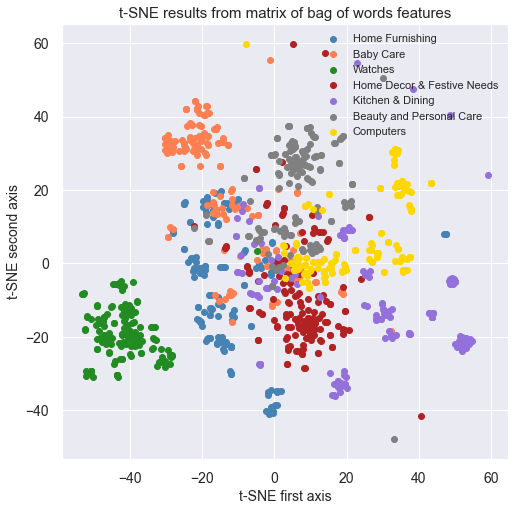

In [158]:
bow_tsne2,  bow_tsne2_cat = tsne_categories(bow_df, txt["level_1"], learning_rate=10, perplexity=15)

3 clusters are rather correctly separated (watches and baby care), the others are not well separated, although the products belonging to the same categories are orften close from each other.

fit time: 0.084s 
inertia: 153455 
Silhouette score: 0.436 
Davies-Bouldin score:0.756


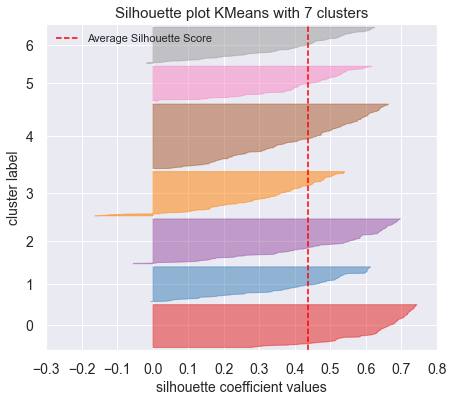

In [159]:
bow_tsne2_kmeans_labels, bow_tsne2_kmeans_centroids = kmeans_simple(bow_tsne2[["axis_1", "axis_2"]], n_clusters=7)

Although the silhouette score and Davies-Boulin scores are not very good, most clusters are well distinct. Except clusters1-2-3 that show important overlap.

t-SNE reduction to **3 dimensions** and corresponding KMeans clustering.

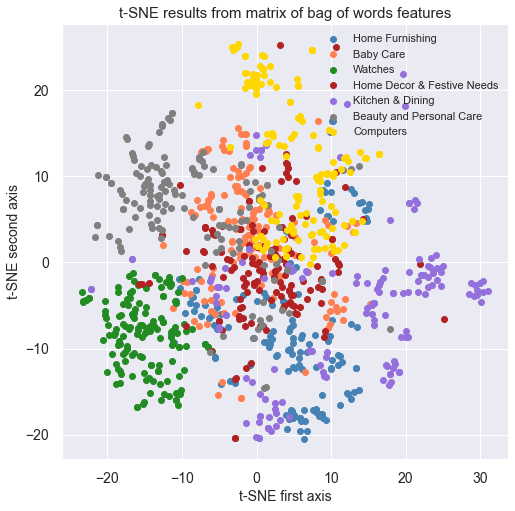

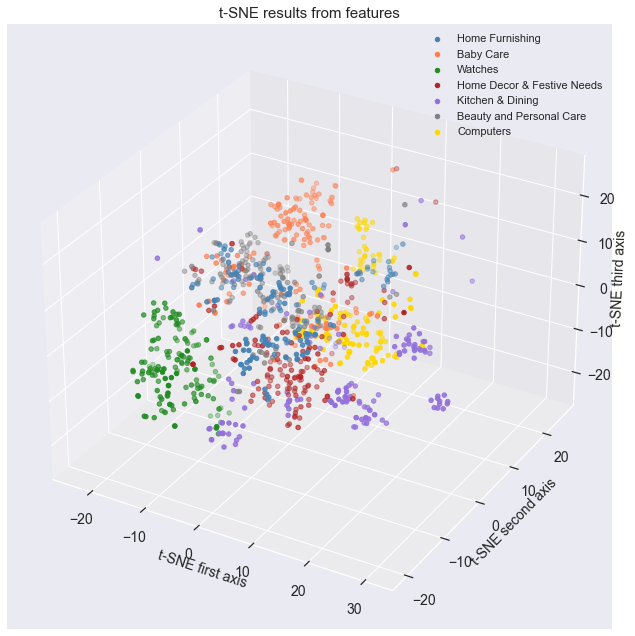

In [160]:
bow_tsne3, bow_tsne3_cat = tsne_categories(bow_df, txt["level_1"], n_components=3, learning_rate=20, perplexity=10)

The detection of categories is better with 3 dimensions (in the 2D visualization the clusters seem less well separated, but this is because we do not see the third dimension here). The clusters are more homogeneous.

fit time: 0.084s 
inertia: 94324 
Silhouette score: 0.318 
Davies-Bouldin score:1.027


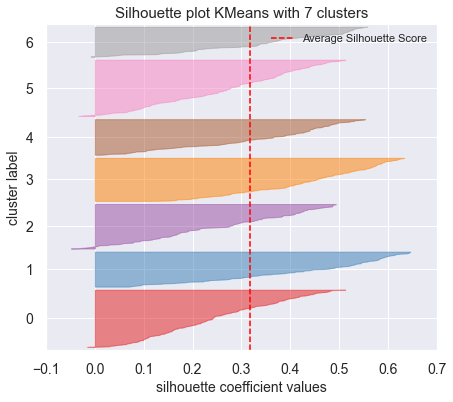

In [161]:
bow_tsne3_kmeans_labels, bow_tsne3_kmeans_centroids = kmeans_simple(bow_tsne3[["axis_1", "axis_2", "axis_3"]], n_clusters=7)

The results of the KMeans are also better, with a better individualisation fo the clusters (no overlap), although the score are lower than with 2 dimensions.

In [171]:
categories_comparison(txt_clean, "kmeans_labels_bow", bow_tsne3_kmeans_labels, "level_1")

Cluster 0
Home Decor & Festive Needs    101
Kitchen & Dining               43
Computers                      31
Beauty and Personal Care       15
Baby Care                       9
Name: level_1, dtype: int64 

Cluster 1
Beauty and Personal Care      102
Baby Care                       8
Home Decor & Festive Needs      7
Kitchen & Dining                5
Name: level_1, dtype: int64 

Cluster 2
Computers                     106
Beauty and Personal Care       24
Home Decor & Festive Needs     14
Kitchen & Dining                9
Baby Care                       2
Name: level_1, dtype: int64 

Cluster 3
Watches    150
Name: level_1, dtype: int64 

Cluster 4
Baby Care                     87
Home Furnishing               23
Home Decor & Festive Needs     7
Beauty and Personal Care       4
Kitchen & Dining               3
Name: level_1, dtype: int64 

Cluster 5
Home Furnishing               127
Baby Care                      34
Home Decor & Festive Needs     17
Kitchen & Dining               1

In [172]:
cat_names = ["Home Decor & Festive Needs", "Beauty and Personal Care", "Computers", "Watches", 
    "Baby Care", "Home Furnishing", "Kitchen & Dining"]

clusters_to_true_labels(txt_clean, "kmeans_labels_bow", "kmeans_labels_bow_names", cat_names)

In [173]:
ari_bow = adjusted_rand_score(txt_clean["level_1"], txt_clean["kmeans_labels_bow_names"])
print(f"The adjusted rand score is {ari_bow:.2f}.")

The adjusted rand score is 0.48.


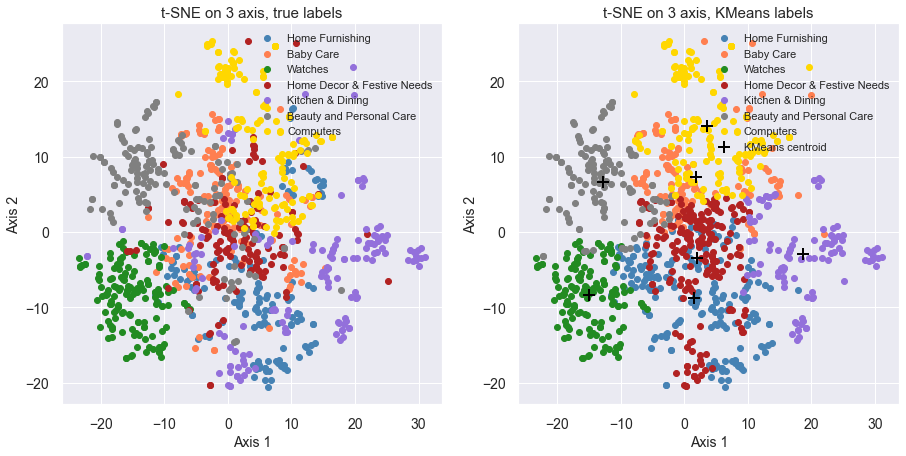

In [174]:
comparison_graph_categories(bow_tsne3, bow_tsne3_cat, 3, categories, 
    txt_clean["kmeans_labels_bow_names"], bow_tsne3_kmeans_centroids)

### With tf-idf

#### KMeans with 200 features used directly

fit time: 0.119s 
inertia: 710 
Silhouette score: 0.180 
Davies-Bouldin score:2.141


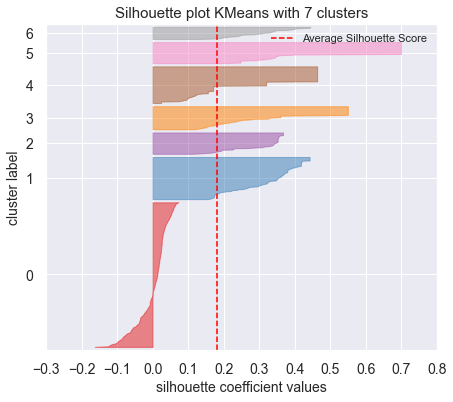

In [175]:
tf_idf_200_labels, tf_idf_200_centroids = kmeans_simple(tf_idf_200, 7)

In [177]:
categories_comparison(txt_clean, "kmeans_labels_tfidf_200", tf_idf_200_labels, "level_1")

Cluster 0
Home Furnishing               150
Baby Care                     140
Home Decor & Festive Needs     69
Kitchen & Dining               51
Beauty and Personal Care       50
Computers                      39
Watches                         3
Name: level_1, dtype: int64 

Cluster 1
Watches    147
Name: level_1, dtype: int64 

Cluster 2
Kitchen & Dining    74
Baby Care            1
Name: level_1, dtype: int64 

Cluster 3
Home Decor & Festive Needs    80
Beauty and Personal Care       1
Name: level_1, dtype: int64 

Cluster 4
Computers                     68
Beauty and Personal Care      25
Kitchen & Dining              25
Baby Care                      9
Home Decor & Festive Needs     1
Name: level_1, dtype: int64 

Cluster 5
Beauty and Personal Care    74
Name: level_1, dtype: int64 

Cluster 6
Computers    43
Name: level_1, dtype: int64 



In [178]:
cat_names = ["Home Furnishing", "Watches", "Kitchen & Dining", "Home Decor & Festive Needs", "Computers", 
     "Beauty and Personal Care", "Baby Care"]

clusters_to_true_labels(txt_clean, "kmeans_labels_tfidf_200", "kmeans_labels_tfidf_200_names", cat_names)

In [179]:
ari_tf_idf_200 = adjusted_rand_score(txt_clean["level_1"], txt_clean["kmeans_labels_tfidf_200_names"])
print(f"The adjusted rand score is {ari_tf_idf_200:.2f}.")

The adjusted rand score is 0.29.


Using t-SNE before KMeans (2500 tf-idf features reducted on 3 t-SNE dimensions)

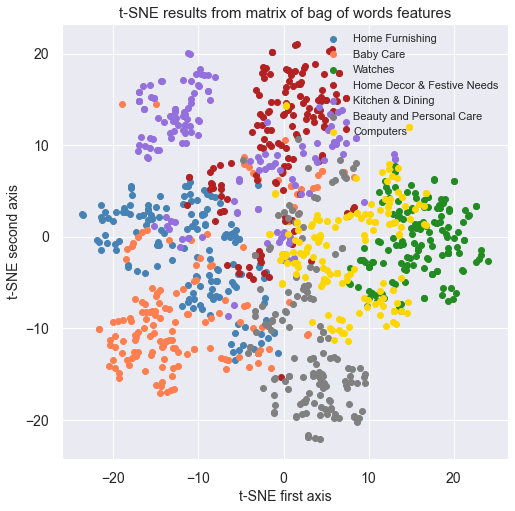

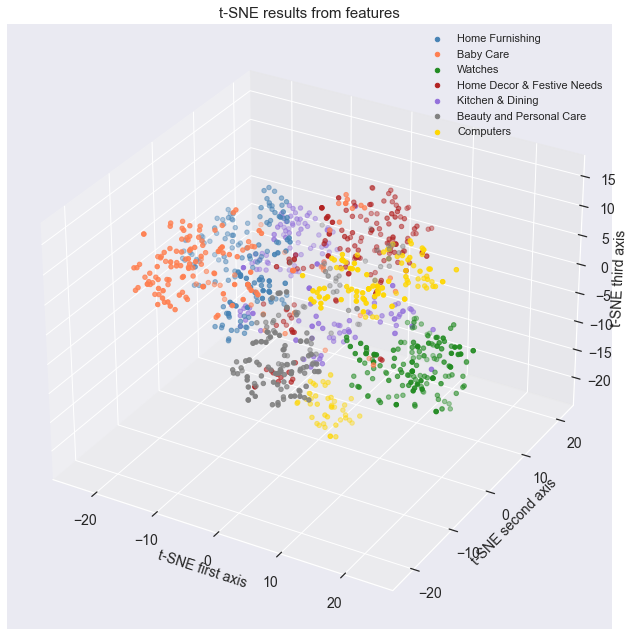

In [181]:
tf_idf_tsne3, tf_idf_tsne3_cat = tsne_categories(tf_idf_df, txt["level_1"], n_components=3, learning_rate=10)

fit time: 0.085s 
inertia: 63566 
Silhouette score: 0.348 
Davies-Bouldin score:0.920


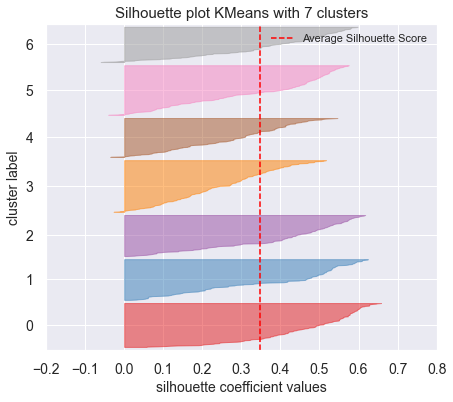

In [182]:
tf_idf_tsne3_kmeans_labels, tf_idf_tsne3_kmeans_centroids = kmeans_simple(tf_idf_tsne3[["axis_1", "axis_2", "axis_3"]], n_clusters=7)

In [183]:
categories_comparison(txt_clean, "kmeans_labels_tfidf_tsne3", tf_idf_tsne3_kmeans_labels, "level_1")

Cluster 0
Watches             148
Kitchen & Dining      3
Computers             2
Name: level_1, dtype: int64 

Cluster 1
Beauty and Personal Care      110
Computers                      11
Home Furnishing                10
Baby Care                       9
Home Decor & Festive Needs      1
Watches                         1
Name: level_1, dtype: int64 

Cluster 2
Home Decor & Festive Needs    103
Kitchen & Dining               23
Baby Care                       6
Computers                       5
Beauty and Personal Care        5
Home Furnishing                 1
Name: level_1, dtype: int64 

Cluster 3
Kitchen & Dining              82
Home Furnishing               75
Home Decor & Festive Needs    12
Baby Care                     11
Name: level_1, dtype: int64 

Cluster 4
Computers                     88
Beauty and Personal Care      23
Baby Care                     10
Home Decor & Festive Needs     9
Kitchen & Dining               4
Watches                        1
Home Furnishing     

In [184]:
cat_names = ["Watches", "Beauty and Personal Care", "Home Decor & Festive Needs", "Home Furnishing", "Computers", 
    "Baby Care", "Kitchen & Dining"]

clusters_to_true_labels(txt_clean, "kmeans_labels_tfidf_tsne3", "kmeans_labels_tfidf_tsne3_names", cat_names)

In [185]:
ari_tf_idf = adjusted_rand_score(txt_clean["level_1"], txt_clean["kmeans_labels_tfidf_tsne3_names"])
print(f"The adjusted rand score is {ari_tf_idf:.2f}.")

The adjusted rand score is 0.46.


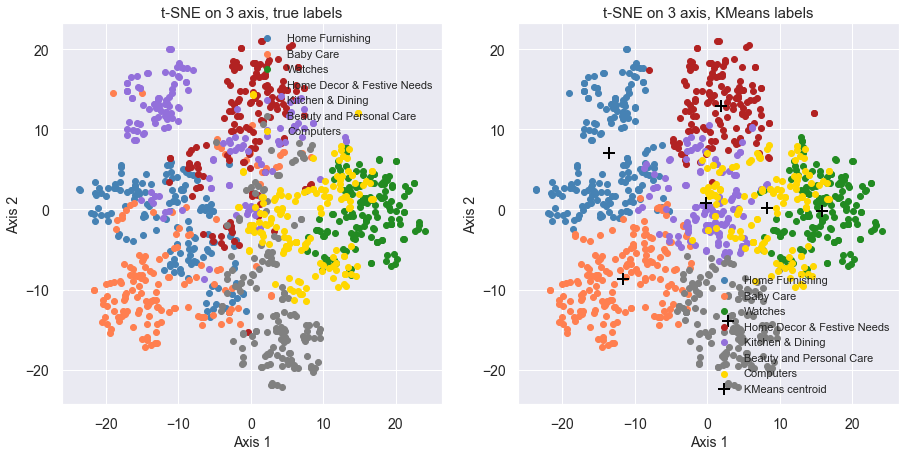

In [186]:
comparison_graph_categories(tf_idf_tsne3, tf_idf_tsne3_cat, 3, categories, txt_clean["kmeans_labels_tfidf_tsne3_names"], 
    tf_idf_tsne3_kmeans_centroids)

#### KMeans with 3 features (200 features from tf-idf reducted on 3 t-SNE dimensions)

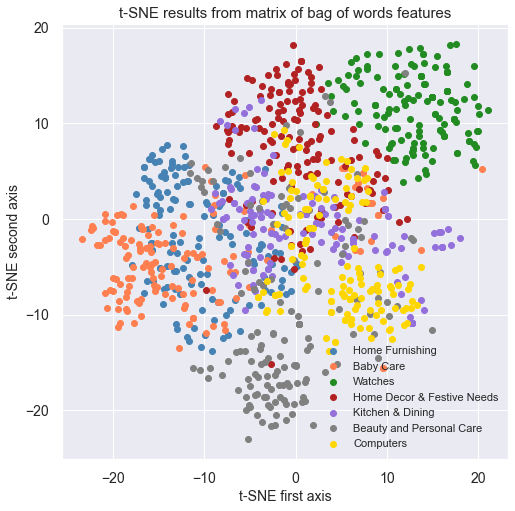

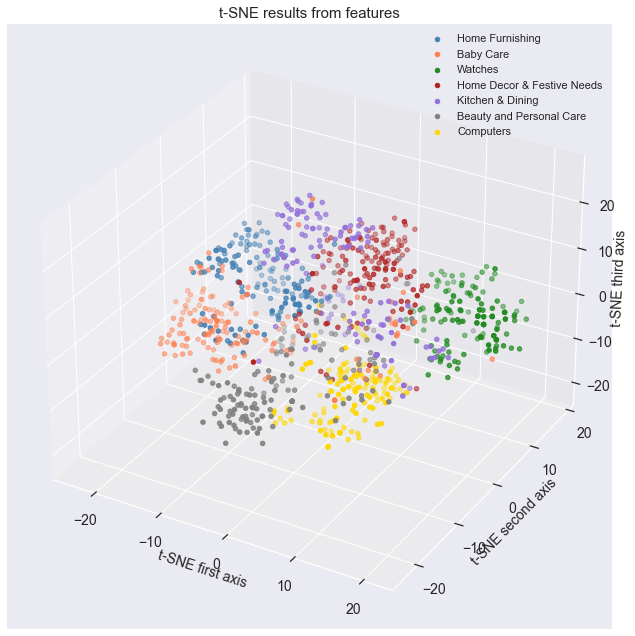

In [187]:
tf_idf_tsne3_200, tf_idf_tsne3_cat_200 = tsne_categories(tf_idf_200, txt["level_1"], n_components=3, perplexity=50, learning_rate=20)

fit time: 0.097s 
inertia: 63352 
Silhouette score: 0.349 
Davies-Bouldin score:0.913


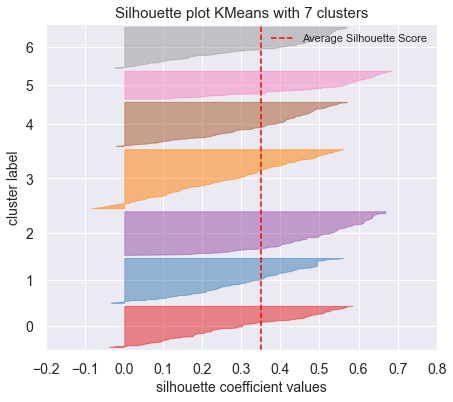

In [189]:
tf_idf_200_tsne3_kmeans_labels, tf_idf_200_tsne3_kmeans_centroids = kmeans_simple(tf_idf_tsne3_200[["axis_1", "axis_2", "axis_3"]], n_clusters=7)

In [190]:
categories_comparison(txt_clean, "kmeans_labels_tfidf_200_tsne3", tf_idf_200_tsne3_kmeans_labels, "level_1")

Cluster 0
Computers                     94
Beauty and Personal Care      27
Kitchen & Dining              11
Baby Care                      6
Home Decor & Festive Needs     5
Name: level_1, dtype: int64 

Cluster 1
Computers                     52
Kitchen & Dining              51
Beauty and Personal Care      25
Home Decor & Festive Needs    14
Baby Care                     13
Home Furnishing                1
Name: level_1, dtype: int64 

Cluster 2
Watches                       149
Home Decor & Festive Needs      1
Beauty and Personal Care        1
Baby Care                       1
Name: level_1, dtype: int64 

Cluster 3
Baby Care                     116
Home Furnishing                81
Home Decor & Festive Needs      4
Beauty and Personal Care        3
Kitchen & Dining                1
Name: level_1, dtype: int64 

Cluster 4
Home Decor & Festive Needs    113
Kitchen & Dining               11
Beauty and Personal Care        9
Home Furnishing                 9
Baby Care                

In [191]:
cat_names = ["Computers", "Kitchen & Dining", "Watches", "Baby Care", "Home Decor & Festive Needs", 
    "Beauty and Personal Care", "Home Furnishing"]

clusters_to_true_labels(txt_clean, "kmeans_labels_tfidf_200_tsne3", "kmeans_labels_tfidf_200_tsne3_names", cat_names)

In [192]:
ari_tf_idf_200_tsne3 = adjusted_rand_score(txt_clean["level_1"], txt_clean["kmeans_labels_tfidf_200_tsne3_names"])
print(f"The adjusted rand score is {ari_tf_idf_200_tsne3:.2f}.")

The adjusted rand score is 0.46.


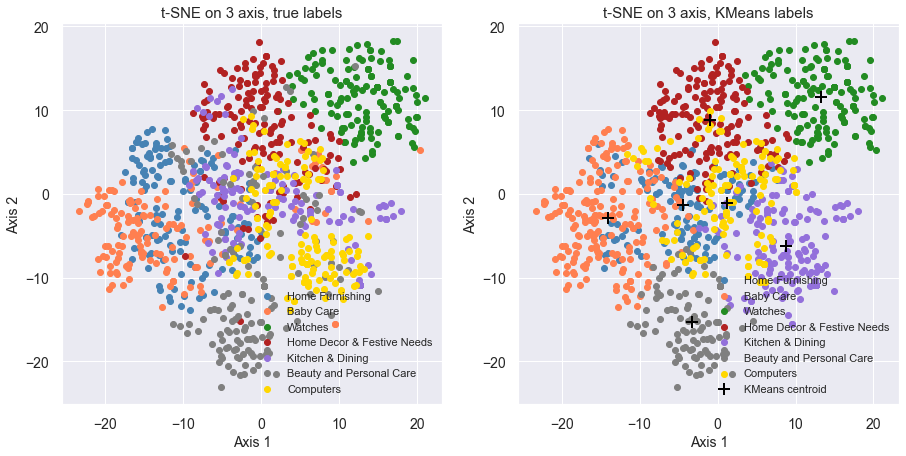

In [193]:
comparison_graph_categories(tf_idf_tsne3_200, tf_idf_tsne3_cat_200, 3, categories, 
    txt_clean["kmeans_labels_tfidf_200_tsne3_names"], tf_idf_200_tsne3_kmeans_centroids)

#### CPA on the 200 features tf-idf

In [194]:
n_comp = 200

X = tf_idf_200.values
noms = tf_idf_200.index
features = tf_idf_200.columns

# Main axes calculation
acp = PCA(n_components=n_comp)
acp.fit(X)

PCA(n_components=200)

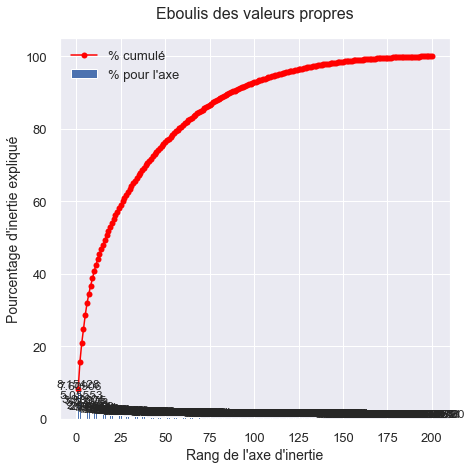

In [195]:
display_eigenvalues(acp, annotate=False)

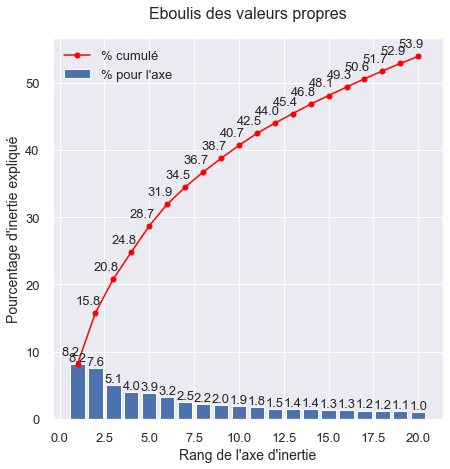

In [197]:
display_eigenvalues(acp)

### Word-embedding

#### Word2Vec

The cleaned, lemmatized and tokenized words we will use:

In [113]:
clean_corpus

[['elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtainkey',
  'elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'floral',
  'curtain',
  'elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'height',
  'curtain',
  'enhance',
  'look',
  'interior',
  'curtain',
  'make',
  'high',
  'quality',
  'polyester',
  'fabric',
  'eyelet',
  'style',
  'stitch',
  'metal',
  'ring',
  'make',
  'room',
  'environment',
  'romantic',
  'love',
  'curtain',
  'ant',
  'wrinkle',
  'anti',
  'shrinkage',
  'elegant',
  'apparance',
  'give',
  'home',
  'bright',
  'modernistic',
  'appeal',
  'design',
  'surreal',
  'attention',
  'sure',
  'steal',
  'heart',
  'contemporary',
  'eyelet',
  'valance',
  'curtain',
  'slide',
  'smoothly',
  'draw',
  'apart',
  'first',
  'thing',
  'morning',
  'welcome',
  'bright',
  'sun',
  'ray',
  'want',
  'wish',
  'good',
  'morn

In [114]:
# Define our parameters' model:
model = Word2Vec(sentences=clean_corpus, min_count=5)

In [115]:
# One example of a vectorized word:
vect_computer = model.wv['computer']
print(f"vector size: {vect_computer.size}")
vect_computer

vector size: 100


array([-0.11059008, -0.23022553, -0.08112752, -0.09098455, -0.03619889,
        0.05926416,  0.01446372,  0.09443203, -0.13897425, -0.38751057,
        0.04608664,  0.27724123,  0.2473027 ,  0.13629888,  0.14772178,
        0.16569033,  0.09117071,  0.01346665, -0.09882597, -0.11728724,
       -0.05188923, -0.07300561,  0.01398682, -0.07237763, -0.00072581,
        0.05096877, -0.03313311, -0.03179745, -0.03086297,  0.18818645,
       -0.094968  , -0.12864508, -0.0455697 ,  0.01232718, -0.05884342,
        0.05751108,  0.09782621, -0.20832442, -0.05530221, -0.02525573,
        0.04073361, -0.05558263, -0.03935615,  0.07999826, -0.09335919,
       -0.08792851, -0.06824777, -0.01108604,  0.00282904,  0.00762963,
       -0.00355988, -0.13495655, -0.17567606,  0.16210464, -0.02870337,
       -0.06307168,  0.0831929 ,  0.11403085,  0.02260143, -0.15189946,
        0.07922839, -0.02424188,  0.2092036 , -0.00306716,  0.09982131,
       -0.09102499, -0.02896716,  0.11569149, -0.1976791 , -0.11

In [116]:
# Similarity between words of the corpus:
print(f"Cotton - elegance : {model.wv.similarity('cotton', 'elegance')}")
print(f"Cotton - computer : {model.wv.similarity('cotton', 'computer')}")
print(f"Cotton - baby : {model.wv.similarity('cotton', 'baby')}")

Cotton - elegance : 0.946418285369873
Cotton - computer : 0.9709763526916504
Cotton - baby : 0.9522668719291687


Same order of similarity between cotton and computer and cotton and elegance...strange.

In [117]:
# First 10 words in the model:
#for index, word in enumerate(model.wv.index_to_key):
#    if index == 10:
#        break
#    print(f"word #{index}/{len(model.wv.index_to_key)} is {word}")

In [118]:
# First 10 words in the model:
for index, word in enumerate(model.wv.vocab.keys()):
    if index == 10:
        break
    print(f"word #{index}/{len(model.wv.vocab.keys())} is {word}")

word #0/1574 is elegance
word #1/1574 is polyester
word #2/1574 is multicolor
word #3/1574 is abstract
word #4/1574 is eyelet
word #5/1574 is door
word #6/1574 is curtainkey
word #7/1574 is curtain
word #8/1574 is floral
word #9/1574 is height


In [119]:
print(f"We have {len(model.wv.vocab)} words in our word2vec vocabulary.")
#print(f"We have {len(model.wv)} words in our word2vec vocabulary.")

We have 1574 words in our word2vec vocabulary.


In [120]:
# Select words that are only in the Word2Vec vocabulary
clean_corpus_wv = clean_corpus.copy()
for i in range(len(clean_corpus)):
    clean_corpus_wv[i] = [w for w in clean_corpus[i] if w in model.wv.vocab.keys()]

In [121]:
clean_corpus_wv

[['elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtainkey',
  'elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'floral',
  'curtain',
  'elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'height',
  'curtain',
  'enhance',
  'look',
  'interior',
  'curtain',
  'make',
  'high',
  'quality',
  'polyester',
  'fabric',
  'eyelet',
  'style',
  'stitch',
  'metal',
  'ring',
  'make',
  'room',
  'love',
  'curtain',
  'ant',
  'anti',
  'elegant',
  'give',
  'home',
  'bright',
  'appeal',
  'design',
  'attention',
  'sure',
  'heart',
  'contemporary',
  'eyelet',
  'curtain',
  'slide',
  'draw',
  'first',
  'morning',
  'bright',
  'sun',
  'want',
  'wish',
  'good',
  'morning',
  'whole',
  'world',
  'draw',
  'create',
  'special',
  'moment',
  'beauty',
  'give',
  'bring',
  'home',
  'elegant',
  'curtain',
  'light',
  'room',
  'get',
  'right',
 

Now we replace each word of each document by its vector and calculate the mean vector for each document.

In [122]:
def mean_document_vector(corpus, model, vector_size, keyed_vector=False):
    """
    Calculate the mean vector of a document from word2vec model.
    Take in input the text corpus, the word2vec model, the vector size 
    and if the model is in keyded vector format or not.
    Return an array containing the documents vectors.
    """
    all_doc_vec = []

    for doc in corpus:
        # Create zeros matrix size of document x size of word vector
        document = np.zeros((len(doc), vector_size))

        # Replace zeros by the word vectors
        for position, word in enumerate(doc):
            if keyed_vector:
                document[position] = model[word]
            else:
                document[position] = model.wv[word]

        # Make mean for each document
        doc_vec_mean = document.mean(axis=0)
        all_doc_vec.append(doc_vec_mean)

    all_doc_vec = np.asarray(all_doc_vec)

    return all_doc_vec

In [123]:
all_doc_vec = mean_document_vector(clean_corpus_wv, model, 100)

Direct use of document vectors in KMeans (100 features).

fit time: 0.089s 
inertia: 163 
Silhouette score: 0.369 
Davies-Bouldin score:0.943


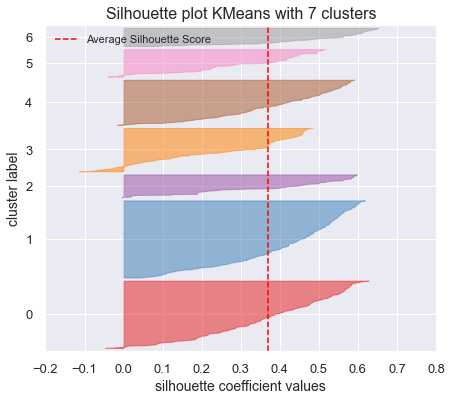

In [124]:
# Use our document vectors as input in the KMeans (100 features)
word2vec_kmeans_labels, word2vec_kmeans_centroids = kmeans_simple(all_doc_vec, n_clusters=7)

In [125]:
categories_comparison(txt_clean, "kmeans_labels_word2vec", word2vec_kmeans_labels, "level_1")

Cluster 0
Beauty and Personal Care      75
Computers                     57
Home Decor & Festive Needs    51
Kitchen & Dining              33
Baby Care                     17
Home Furnishing                1
Name: level_1, dtype: int64 

Cluster 1
Home Decor & Festive Needs    62
Home Furnishing               50
Beauty and Personal Care      43
Kitchen & Dining              43
Computers                     39
Baby Care                     27
Watches                        4
Name: level_1, dtype: int64 

Cluster 2
Watches    80
Name: level_1, dtype: int64 

Cluster 3
Home Furnishing               60
Kitchen & Dining              53
Computers                     18
Baby Care                     11
Home Decor & Festive Needs     6
Watches                        2
Beauty and Personal Care       1
Name: level_1, dtype: int64 

Cluster 4
Baby Care                     95
Home Furnishing               39
Home Decor & Festive Needs     8
Beauty and Personal Care       7
Kitchen & Dining        

Categories are too messed up to make a correspondance with true categories and calculate an ARI score.

Using t-SNE before KMeans to reduce the 100 dimensions to 3 dimensions.

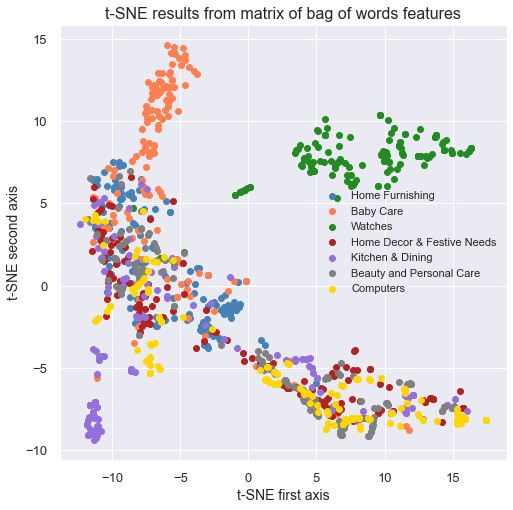

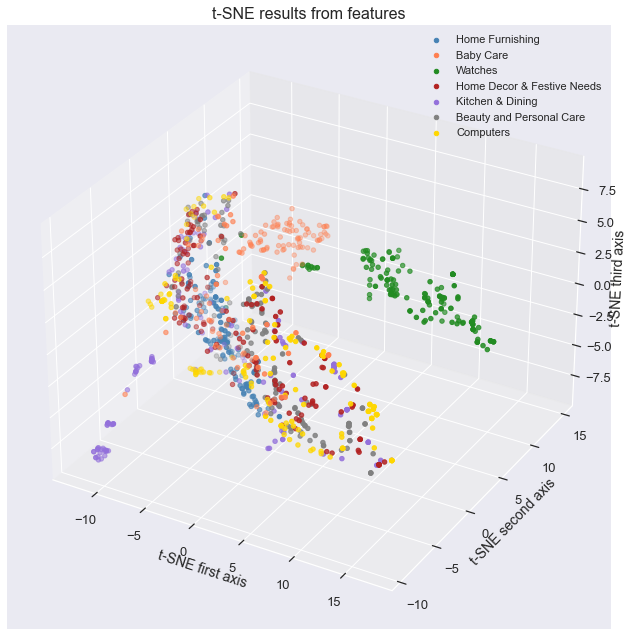

In [150]:
word2vec_tsne, word2vec_tsne_cat = tsne_categories(all_doc_vec, txt["level_1"], n_components=3)

We can see 3-4 partly well separated clusters, but with a large cluster mixing all categories in the center. The results are not very concluant.

fit time: 0.068s 
inertia: 18844 
Silhouette score: 0.440 
Davies-Bouldin score:0.870


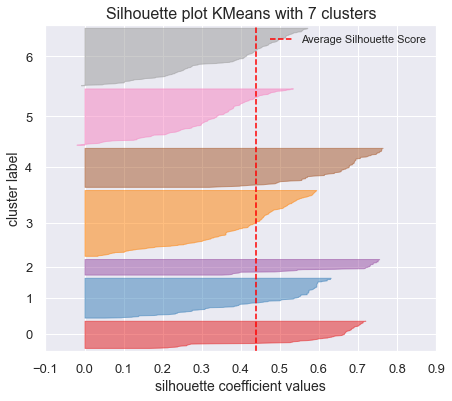

In [127]:
word2vec_tsne3_kmeans_labels, word2vec_tsne3_kmeans_centroids = kmeans_simple(word2vec_tsne[["axis_1", "axis_2", "axis_3"]], n_clusters=7)

In [128]:
categories_comparison(txt_clean, "kmeans_labels_word2vec_tsne3", word2vec_tsne3_kmeans_labels, "level_1")

Cluster 0
Baby Care    84
Watches      11
Name: level_1, dtype: int64 

Cluster 1
Computers                     47
Beauty and Personal Care      37
Home Decor & Festive Needs    29
Kitchen & Dining              24
Baby Care                      2
Name: level_1, dtype: int64 

Cluster 2
Kitchen & Dining    54
Baby Care            1
Name: level_1, dtype: int64 

Cluster 3
Home Decor & Festive Needs    52
Home Furnishing               42
Beauty and Personal Care      41
Computers                     37
Kitchen & Dining              33
Baby Care                     22
Watches                        2
Name: level_1, dtype: int64 

Cluster 4
Watches    136
Name: level_1, dtype: int64 

Cluster 5
Home Furnishing               105
Baby Care                      26
Home Decor & Festive Needs     21
Computers                      20
Kitchen & Dining               14
Beauty and Personal Care        9
Watches                         1
Name: level_1, dtype: int64 

Cluster 6
Beauty and Personal Car

In [151]:
cat_names = ["Baby Care", "Computers", "Kitchen & Dining", "Home Decor & Festive Needs", "Watches", 
    "Home Furnishing", "Beauty and Personal Care"]

clusters_to_true_labels(txt_clean, "kmeans_labels_word2vec_tsne3", "kmeans_labels_word2vec_tsne3_names", cat_names)

In [152]:
ari_word2vec_tsne3 = adjusted_rand_score(txt_clean["level_1"], txt_clean["kmeans_labels_word2vec_tsne3_names"])
print(f"The adjusted rand score is {ari_word2vec_tsne3:.2f}.")

The adjusted rand score is 0.27.


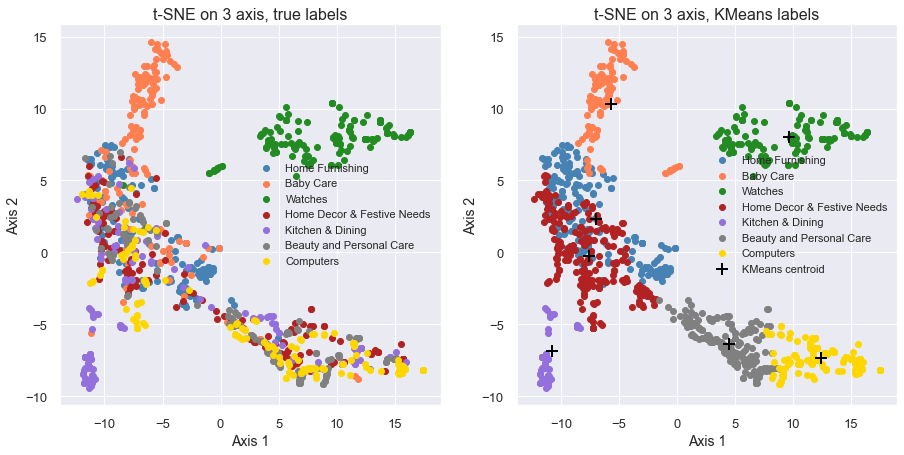

In [153]:
comparison_graph_categories(word2vec_tsne, word2vec_tsne_cat, 3, categories, 
    txt_clean["kmeans_labels_word2vec_tsne3_names"], word2vec_tsne3_kmeans_centroids)

Let's try to get an image of the similarities of the corpus words. We will reduce their vectors dimensions and represent them in 2D with t-SNE.

In [163]:
def word2vec_tsne(model, nb_dim):

    """
    Operate a t-SNE with the specified number of dimensions on the vectors of Word2Vec specified model.
    Return x and y coordinates on the t-SNE axis and corresponding words.
    """

    # Extract the words & their vectors, as numpy arrays
    vectors = np.asarray(model.wv.vectors)
    words = list(model.wv.vocab.keys())

    # Reduce using t-SNE
    tsne = TSNE(n_components=nb_dim, random_state=0)
    vectors = tsne.fit_transform(vectors)

    # Get t-SNE coordinates and corresponding words
    x_val = [v[0] for v in vectors]
    y_val = [v[1] for v in vectors]

    return x_val, y_val, words

In [164]:
x_val, y_val, words = word2vec_tsne(model, 2)

In [166]:
# Select 30 words at random in the corpus:
random.seed(5)
indices = list(range(len(words)))
selected_indices = random.sample(indices, 25)

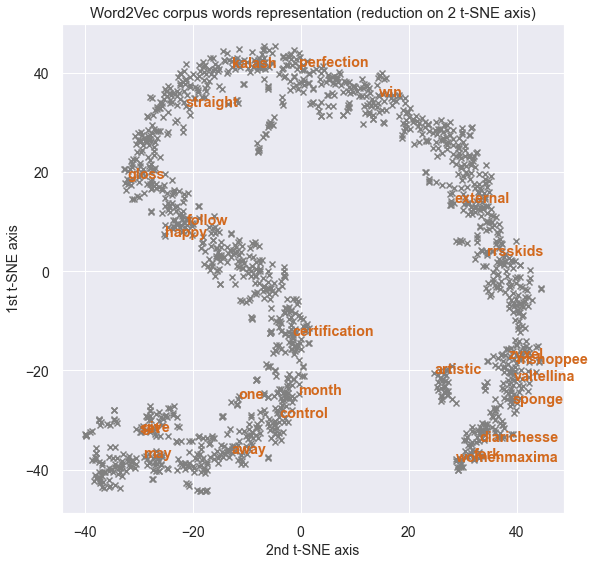

In [314]:
fig, ax = plt.subplots(figsize=(9, 9))

ax.scatter(x_val, y_val, marker="x", color="grey")
for i in selected_indices:
        ax.annotate(words[i], (x_val[i], y_val[i]), fontsize="large", color="chocolate", fontweight="semibold")
ax.set_title("Word2Vec corpus words representation (reduction on 2 t-SNE axis)")
ax.set_xlabel("2nd t-SNE axis")
ax.set_ylabel("1st t-SNE axis")

#fig.savefig("fig/w2v_mpl.png", bbox_inches="tight", dpi=150);

In [168]:
trace_data = go.Scatter(x=x_val, y=y_val, mode="markers", text=words,
                        marker=dict(size=10, color="steelblue", line_color="white", line_width=1))

fig = go.Figure(data=trace_data)

fig.update_layout(title_text = "Word2Vec corpus words representation (reduction on 2 t-SNE axis)",
                    width=650, height=650,
                    xaxis=dict(linecolor='black', linewidth=1),
                    yaxis=dict(linecolor='black', linewidth=1),
                    margin=dict(l=50, r=50,b=50,t=80, pad=4))

fig.show()

With pre-trained Word2Vec models.

In [169]:
# Get the available models
info = gensim_api.info()

for model_name, model_data in sorted(info['models'].items()):
    print('%s (%d records): %s' % (model_name, model_data.get('num_records', -1), 
        model_data['description'][:80] + '...',))

__testing_word2vec-matrix-synopsis (-1 records): [THIS IS ONLY FOR TESTING] Word vecrors of the movie matrix....
conceptnet-numberbatch-17-06-300 (1917247 records): ConceptNet Numberbatch consists of state-of-the-art semantic vectors (also known...
fasttext-wiki-news-subwords-300 (999999 records): 1 million word vectors trained on Wikipedia 2017, UMBC webbase corpus and statmt...
glove-twitter-100 (1193514 records): Pre-trained vectors based on  2B tweets, 27B tokens, 1.2M vocab, uncased (https:...
glove-twitter-200 (1193514 records): Pre-trained vectors based on 2B tweets, 27B tokens, 1.2M vocab, uncased (https:/...
glove-twitter-25 (1193514 records): Pre-trained vectors based on 2B tweets, 27B tokens, 1.2M vocab, uncased (https:/...
glove-twitter-50 (1193514 records): Pre-trained vectors based on 2B tweets, 27B tokens, 1.2M vocab, uncased (https:/...
glove-wiki-gigaword-100 (400000 records): Pre-trained vectors based on Wikipedia 2014 + Gigaword 5.6B tokens, 400K vocab, ...
glove-wik

In [170]:
# More infos on the W2V Google News model:
word2vec_google_news_300_info = gensim_api.info("word2vec-google-news-300")
print(json.dumps(word2vec_google_news_300_info, indent=4))

{
    "num_records": 3000000,
    "file_size": 1743563840,
    "base_dataset": "Google News (about 100 billion words)",
    "reader_code": "https://github.com/RaRe-Technologies/gensim-data/releases/download/word2vec-google-news-300/__init__.py",
    "license": "not found",
    "parameters": {
        "dimension": 300
    },
    "description": "Pre-trained vectors trained on a part of the Google News dataset (about 100 billion words). The model contains 300-dimensional vectors for 3 million words and phrases. The phrases were obtained using a simple data-driven approach described in 'Distributed Representations of Words and Phrases and their Compositionality' (https://code.google.com/archive/p/word2vec/).",
    "read_more": [
        "https://code.google.com/archive/p/word2vec/",
        "https://arxiv.org/abs/1301.3781",
        "https://arxiv.org/abs/1310.4546",
        "https://www.microsoft.com/en-us/research/publication/linguistic-regularities-in-continuous-space-word-representatio

In [171]:
# If downloading archive needed
#path_w2v = os.path.join(path_to_txt_folder, "GoogleNews-vectors-negative300.bin")
#w2v_GN_300 = KeyedVectors.load_word2vec_format(path_w2v, binary=True)

In [172]:
w2v_GN_300 = gensim_api.load("word2vec-google-news-300")

In [173]:
w2v_GN_300["boy"]

array([ 2.35351562e-01,  1.65039062e-01,  9.32617188e-02, -1.28906250e-01,
        1.59912109e-02,  3.61328125e-02, -1.16699219e-01, -7.32421875e-02,
        1.38671875e-01,  1.15356445e-02,  1.87500000e-01, -2.91015625e-01,
        1.70898438e-02, -1.84570312e-01, -2.87109375e-01,  2.54821777e-03,
       -2.19726562e-01,  1.77734375e-01, -1.20605469e-01,  5.39550781e-02,
        3.78417969e-02,  2.49023438e-01,  1.76757812e-01,  2.69775391e-02,
        1.21093750e-01, -3.51562500e-01, -5.83496094e-02,  1.22070312e-01,
        5.97656250e-01, -1.60156250e-01,  1.08398438e-01, -2.40478516e-02,
       -1.16699219e-01,  3.58886719e-02, -2.37304688e-01,  1.15234375e-01,
        5.27343750e-01, -2.18750000e-01, -4.54101562e-02,  3.30078125e-01,
        3.75976562e-02, -5.51757812e-02,  3.26171875e-01,  6.74438477e-03,
        3.71093750e-01,  3.68652344e-02,  6.68945312e-02,  5.17578125e-02,
       -4.76074219e-02, -7.91015625e-02,  4.46777344e-02,  1.67968750e-01,
        5.51757812e-02, -

In [174]:
print(f"We have {len(vocabulary)} words in our whole corpus (including some badly cleaned words).")

We have 51618 words in our whole corpus (including some badly cleaned words).


In [175]:
common_vocabulary = set(vocabulary) & set(w2v_GN_300.vocab.keys())
print(f"{len(common_vocabulary)} words of our corpus are in the Google pre-trained model, equivalent to {len(common_vocabulary)*100/len(vocabulary):.2f} %.")

3561 words of our corpus are in the Google pre-trained model, equivalent to 6.90 %.


Very few of our words are in the pre-trained model...

In [176]:
# Select words that are only in Word2Vec pre-trained vocabulary
clean_corpus_wv_google = clean_corpus.copy()
for i in range(len(clean_corpus)):
    clean_corpus_wv_google[i] = [w for w in clean_corpus[i] if w in w2v_GN_300.vocab.keys()]

In [177]:
clean_corpus_wv_google

[['elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'floral',
  'curtain',
  'elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'height',
  'curtain',
  'enhance',
  'look',
  'interior',
  'curtain',
  'make',
  'high',
  'quality',
  'polyester',
  'fabric',
  'eyelet',
  'style',
  'stitch',
  'metal',
  'ring',
  'make',
  'room',
  'environment',
  'romantic',
  'love',
  'curtain',
  'ant',
  'wrinkle',
  'anti',
  'shrinkage',
  'elegant',
  'give',
  'home',
  'bright',
  'modernistic',
  'appeal',
  'design',
  'surreal',
  'attention',
  'sure',
  'steal',
  'heart',
  'contemporary',
  'eyelet',
  'valance',
  'curtain',
  'slide',
  'smoothly',
  'draw',
  'apart',
  'first',
  'thing',
  'morning',
  'welcome',
  'bright',
  'sun',
  'ray',
  'want',
  'wish',
  'good',
  'morning',
  'whole',
  'world',
  '

In [178]:
all_doc_vec_gn300 = mean_document_vector(clean_corpus_wv_google, w2v_GN_300, 300, keyed_vector=True)

t-SNE reduction then KMeans

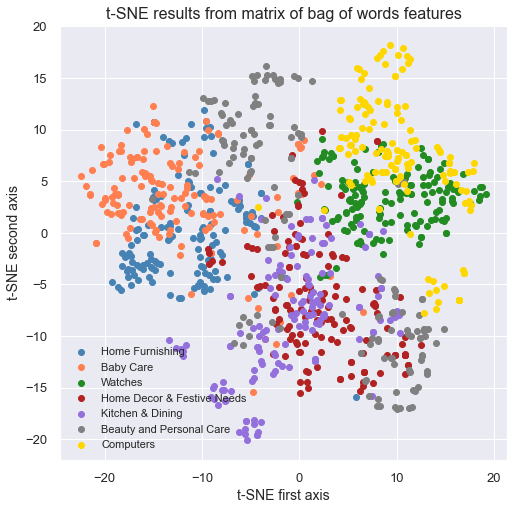

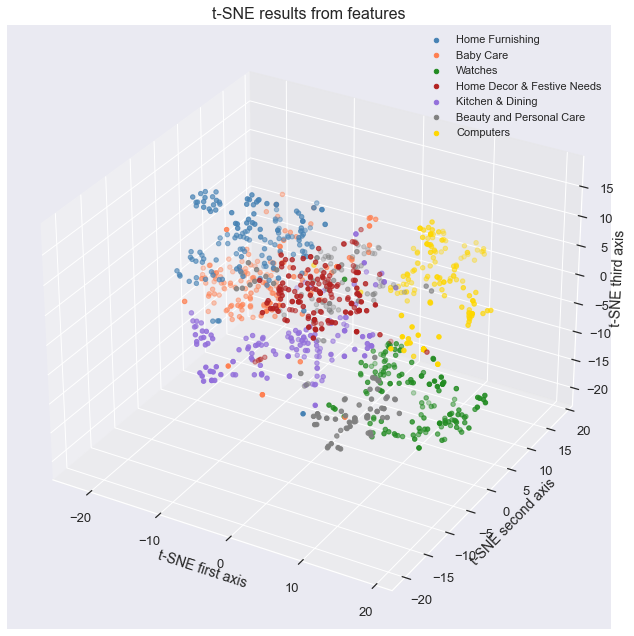

In [181]:
w2v_gn300_tsne, w2v_gn300_tsne_cat = tsne_categories(all_doc_vec_gn300, txt["level_1"], n_components=3, learning_rate=20, perplexity=20)

fit time: 0.091s 
inertia: 56100 
Silhouette score: 0.368 
Davies-Bouldin score:0.971


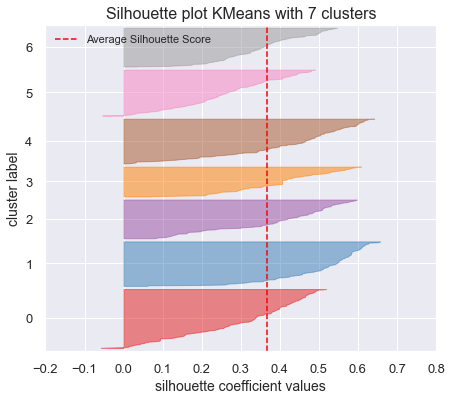

In [182]:
w2v_gn300_tsne3_kmeans_labels, w2v_gn300_tsne3_kmeans_centroids = kmeans_simple(w2v_gn300_tsne[["axis_1", "axis_2", "axis_3"]], n_clusters=7)

In [183]:
categories_comparison(txt_clean, "kmeans_labels_w2v_gn300_tsne3", w2v_gn300_tsne3_kmeans_labels, "level_1")

Cluster 0
Baby Care                     117
Beauty and Personal Care       64
Home Furnishing                19
Kitchen & Dining                3
Home Decor & Festive Needs      2
Name: level_1, dtype: int64 

Cluster 1
Watches                       149
Home Decor & Festive Needs      3
Beauty and Personal Care        3
Name: level_1, dtype: int64 

Cluster 2
Home Decor & Festive Needs    113
Beauty and Personal Care       10
Kitchen & Dining                7
Baby Care                       3
Home Furnishing                 2
Name: level_1, dtype: int64 

Cluster 3
Beauty and Personal Care      59
Computers                     27
Kitchen & Dining              15
Home Decor & Festive Needs     1
Home Furnishing                1
Baby Care                      1
Name: level_1, dtype: int64 

Cluster 4
Computers                     122
Baby Care                      10
Home Decor & Festive Needs      9
Kitchen & Dining                7
Beauty and Personal Care        7
Watches             

In [184]:
cat_names = ["Baby Care", "Watches", "Home Decor & Festive Needs", "Beauty and Personal Care", "Computers", 
    "Kitchen & Dining", "Home Furnishing"]

clusters_to_true_labels(txt_clean, "kmeans_labels_w2v_gn300_tsne3", "kmeans_labels_w2v_gn300_tsne3_names", cat_names)

In [185]:
ari_w2v_gn300_tsne3 = adjusted_rand_score(txt_clean["level_1"], txt_clean["kmeans_labels_w2v_gn300_tsne3_names"])
print(f"The adjusted rand score is {ari_w2v_gn300_tsne3:.2f}.")

The adjusted rand score is 0.58.


Not bad! Better than other models.

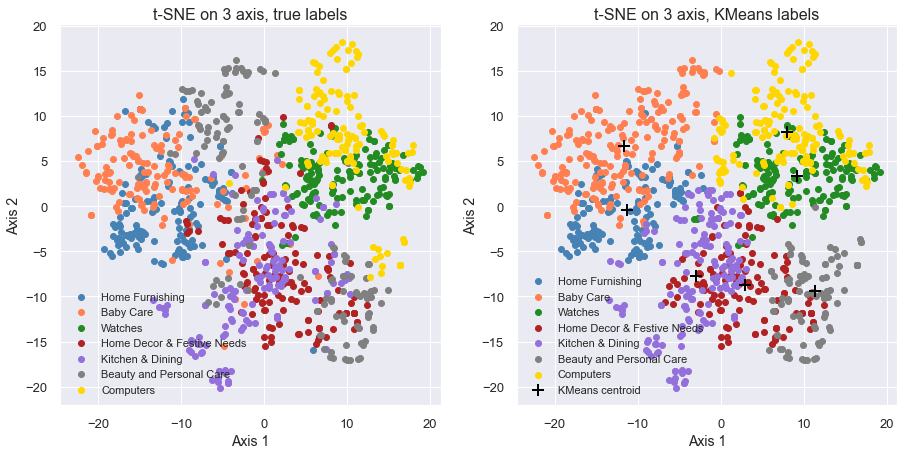

In [186]:
comparison_graph_categories(w2v_gn300_tsne, w2v_gn300_tsne_cat,3, categories, 
    txt_clean["kmeans_labels_w2v_gn300_tsne3_names"], w2v_gn300_tsne3_kmeans_centroids)

#### Doc2Vec

In [190]:
documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(corpus)]

# Build model and vocabulary:
model = Doc2Vec(min_count=3, vector_size=300, epochs=40)
model.build_vocab(documents)

# Train model (on the whole corpus)
model.train(documents, total_examples=model.corpus_count, epochs=model.epochs)

In [195]:
def doc2vec_simple(corpus, min_count=3, epochs=20, vector_size=100):
    """
    Compute Doc2Vec algorithm on the corpus with indicated parameters:
    - min_count (int) minimum number of occurences of a word to be included in the doc2vec
    - epochs (int) number of iterations of the model
    - vector_size (int) number of vectors to build for each documentation
    Return an array of size N x vector_size (with N number of documents in the corpus).
    """
    # Tag the documents and words of each document in the corpus:
    documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(corpus)]

    # Build model and vocabulary:
    model = Doc2Vec(min_count=min_count, vector_size=vector_size, epochs=epochs)
    model.build_vocab(documents)

    # Train model (on the whole corpus)
    model.train(documents, total_examples=model.corpus_count, epochs=model.epochs)

    # Append vectors in a matrix:
    dv_matrix = model[0]
    for i in range(1, len(documents)):
        dv_matrix = np.vstack([dv_matrix, model[i]])

    return dv_matrix, model

Doc2Vec then KMeans with `vector_size=300`.

In [196]:
dv_matrix_300, model = doc2vec_simple(clean_corpus, min_count=3, vector_size=300, epochs=40)

In [201]:
# Not available in gensim 3.8.3 (only gensim 4.0 and >)
# print(f"Word 'table' appeared {model.wv.get_vecattr('table', 'count')} times in the corpus.")

In [202]:
# Vector for the first document of the model:
model[0]

array([-0.13803402,  0.1503638 ,  0.06348351,  0.17198628, -0.06874038,
       -0.04224155, -0.0927638 ,  0.0335069 ,  0.1004799 , -0.5229326 ,
        0.40494344,  0.7273422 ,  0.25275713,  0.05126363,  0.5547815 ,
       -0.12182305,  0.7722203 ,  0.1450748 ,  0.25514835, -0.44594973,
       -0.49129027, -0.28774908,  0.20560695,  0.30143481,  0.4067379 ,
        0.5335736 , -0.33712727, -0.25681573,  0.09288619, -0.03003651,
       -0.22362371, -0.54732734, -0.3366856 , -0.41550106,  0.17849788,
        0.42941597,  0.17931095, -0.23446497, -0.2605827 ,  0.46978408,
        0.12474539,  0.06599875,  0.00841182,  0.40489003, -0.23990035,
        0.52489555,  0.21368578, -0.00538237, -0.10282389,  0.21917078,
       -0.13283476,  0.37012008,  0.23775204,  0.5615711 , -0.38479832,
        0.5876413 , -0.20426734,  0.09950545, -0.23465368, -0.24377748,
       -0.05454332, -0.33878002,  0.3011982 ,  0.1336229 , -0.09241072,
       -0.08867278,  0.0867539 , -0.0260776 , -0.12659411, -0.32

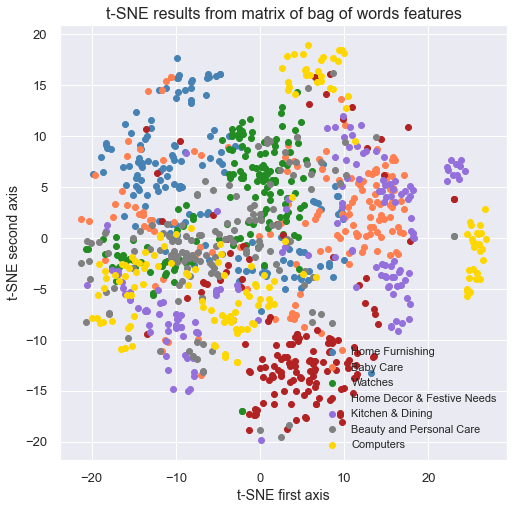

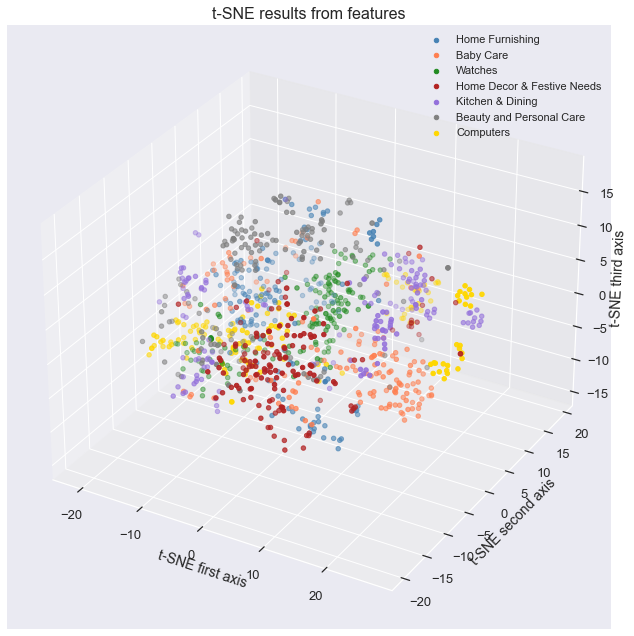

In [204]:
dv_300_tsne3, dv_300_tsne3_cat = tsne_categories(dv_matrix_300, txt["level_1"], n_components=3, learning_rate=20, perplexity=20)

fit time: 0.106s 
inertia: 57026 
Silhouette score: 0.330 
Davies-Bouldin score:0.989


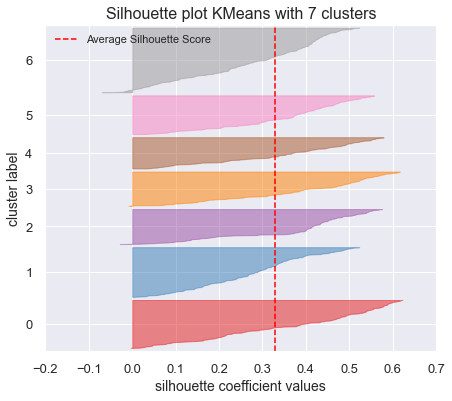

In [205]:
d2v_300_tsne3_kmeans_labels, d2v_300_tsne3_kmeans_centroids = kmeans_simple(dv_300_tsne3[["axis_1", "axis_2", "axis_3"]], 7)

In [206]:
categories_comparison(txt_clean, "kmeans_labels_d2v_300_tsne3", d2v_300_tsne3_kmeans_labels, "level_1")

Cluster 0
Home Decor & Festive Needs    105
Computers                      30
Baby Care                      14
Beauty and Personal Care       11
Home Furnishing                 3
Watches                         2
Kitchen & Dining                2
Name: level_1, dtype: int64 

Cluster 1
Watches                       94
Computers                     29
Beauty and Personal Care      14
Baby Care                     13
Kitchen & Dining              12
Home Decor & Festive Needs     9
Home Furnishing                2
Name: level_1, dtype: int64 

Cluster 2
Kitchen & Dining              75
Computers                     27
Home Decor & Festive Needs     8
Home Furnishing                7
Beauty and Personal Care       3
Baby Care                      2
Name: level_1, dtype: int64 

Cluster 3
Beauty and Personal Care      79
Home Furnishing               13
Kitchen & Dining              11
Home Decor & Festive Needs     6
Computers                      6
Baby Care                      3
Watch

In [207]:
cat_names = ["Home Decor & Festive Needs", "Watches", "Kitchen & Dining", "Beauty and Personal Care", "Home Furnishing", 
    "Baby Care", "Computers"]

clusters_to_true_labels(txt_clean, "kmeans_labels_d2v_300_tsne3", "kmeans_labels_d2v_300_tsne3_names", cat_names)

In [208]:
ari_doc2vec_tsne3 = adjusted_rand_score(txt_clean["level_1"], txt_clean["kmeans_labels_d2v_300_tsne3_names"])
print(f"The adjusted rand score is {ari_doc2vec_tsne3:.2f}.")

The adjusted rand score is 0.25.


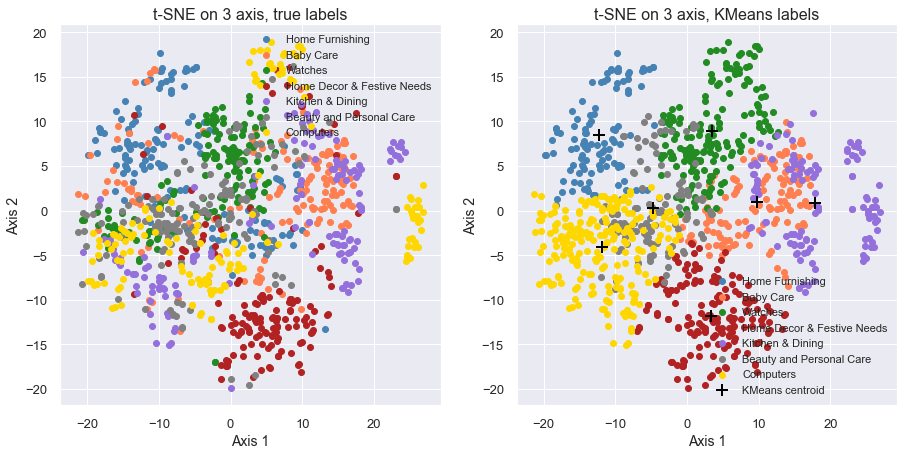

In [209]:
comparison_graph_categories(dv_300_tsne3, dv_300_tsne3_cat, 3, categories, 
    txt_clean["kmeans_labels_d2v_300_tsne3_names"], d2v_300_tsne3_kmeans_centroids)

Doc2Vec then KMeans with `vector_size=50`.

In [210]:
dv_matrix_50, model = doc2vec_simple(clean_corpus, min_count=3, vector_size=50, epochs=40)

fit time: 0.117s 
inertia: 6505 
Silhouette score: 0.290 
Davies-Bouldin score:2.294


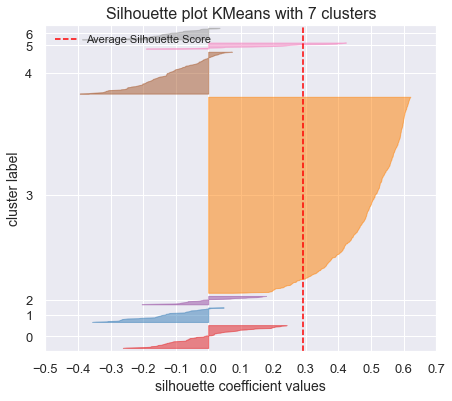

In [211]:
doc2vec_50_kmeans_labels, doc2vec_50_kmeans_centroids = kmeans_simple(dv_matrix_50, 7)

t-SNE with Doc2Vec vectors (50 dimensions reduced to 2).

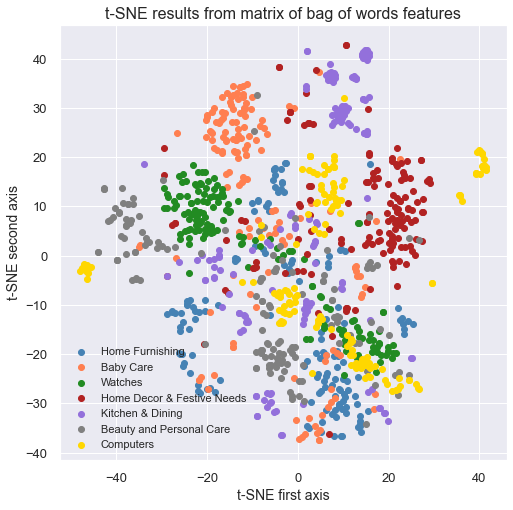

In [212]:
dv_50_tsne2, dv_50_tsne2_cat = tsne_categories(dv_matrix_50, txt["level_1"], n_components=2)

## Computer vision

### ORB

The general method is:
* Load and preprocess images (pass to grayscale and equalize histograms).
* Calculate descriptors using the ORB algorithm, gather all descriptors of all images in a matrix.
* Make a clustering of the descriptors.
* For each image, calculate an histogram counting the number of descriptors belonging to each cluster. This histogram represents the image features (visual bag-of-features). There are as many features per image as the number of clusters.
* (possible to make a CPA at this stage to lower computing time)
* Use the histograms as features in a clustering with k = number of categories to detect.
* Make a t-SNE to visualize the clustering results.

In [57]:
# Check path
path_to_images_folder

'images/'

One example of image pre-processing and descriptors computation.

In [103]:
path_example = path_to_images_folder + "\\" + "55b85ea15a1536d46b7190ad6fff8ce7.jpg"
img_ex = cv2.imread(path_example)

# Convert tot grayscale and equalize
img_ex_nb = cv2.cvtColor(img_ex, cv2.COLOR_RGB2GRAY)
img_exa_nb = cv2.equalizeHist(img_ex_nb)

# ORB processing
orb_test = cv2.ORB_create()
kp, des = orb_test.detectAndCompute(img_ex_nb, None)
img_ex_kp = cv2.drawKeypoints(img_ex_nb, kp, np.array([]), (0, 0, 255), 
    cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Visualization of keypoints
#cv2.namedWindow('ORB_image', cv2.WINDOW_NORMAL)
#cv2.resizeWindow('ORB_image', 1000, 1000)
cv2.imshow('ORB_processing_example', img_ex_kp)
cv2.waitKey()
cv2.destroyAllWindows()

# Image descriptors
des

array([[ 72, 115,  26, ..., 130,  10,  27],
       [106, 153,  54, ...,   0, 231, 155],
       [114, 115, 101, ...,  12,  86,  87],
       ...,
       [130,  67,   6, ...,  21, 161, 208],
       [ 35, 189,  32, ...,  12, 187, 222],
       [ 89, 187,  88, ..., 132, 236, 125]], dtype=uint8)

Same for all images now.

In [143]:
# Load images

# filenames = [img for img in glob.glob(path_to_images_folder + "/*.jpg")]
img_filenames = txt_clean["image"]
img_paths = [path_to_images_folder + "\\" + img for img in img_filenames]
img = [cv2.imread(img) for img in img_paths]

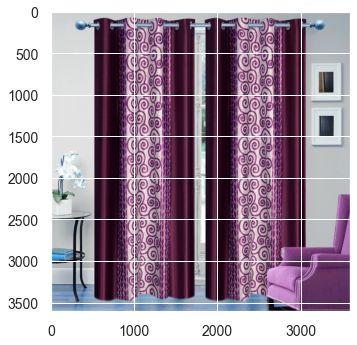

In [144]:
# Example first image
plt.imshow(img[0]);

In [145]:
# Preprocess images: grayscale and equalize
img = [cv2.cvtColor(img[i], cv2.COLOR_RGB2GRAY) for i in range(len(img))]
img = [cv2.equalizeHist(img[i]) for i in range(len(img))]

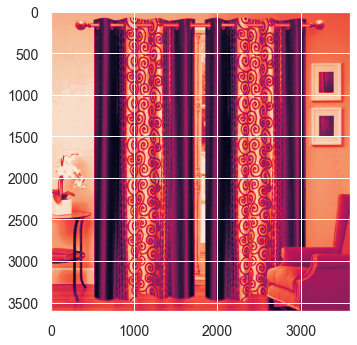

In [146]:
# Post preprocessing:
plt.imshow(img[0]);

In [198]:
def ORB_hist_tsne(images, kmeans_n_clusters, nfeatures=500, WTA_K=2, scale_factor=1.2, k="sqrt", 
    batch_size=1024, mbatch_max_iter=1000, n_comp=2, method="barnes_hut", init="pca", n_jobs=-2, 
    learning_rate=200, perplexity=30, random_state=None):
    """
    Use ORB algorithm to extract descriptors from input images.
    Group the descriptors with MiniBatch KMeans.
    Make histograms from the clustering results.
    Reduce histogram dimensions with t-SNE.
    Use t-SNE results in a KMeans to cluster images.
    Return the images histograms, the kmeans object and t-SNE results.

    images: iterable containing preprocessed images
    kmeans_n_clusters (int): number of categories to use for images clustering

    ORB parameters
    nfeatures (int): max number of features to select per image
    WTA_K (int): number of points that produce each element of the oriented BRIEF descriptor.
    scale_factor (float): pyramid decimation ratio (> 1)

    MiniBatch KMeans parameters:
    k: "sqrt", "10-times" or int. Number of clusters. If "sqrt", take the squared root of the 
        number of descriptors. If "10-time", take 10 times the number of image categories. 
        Or specify number of clusters (int).
    batch_size (int): MiniBatch size
    mbatch_max_iter (int): Max number of iterations

    t-SNE parameters
    n_comp (int): number of components
    method (str): "barnes_hut" (by default) or "exact"
    init (str): initialisation, default is "pca"
    n_jobs (int): The number of parallel jobs to run for neighbors search.
    learning_rate (int): Usually in the range [10.0, 1000.0].
    perplexity (int): Related to the number of nearest neighbors that is used in other 
    manifold learning algorithms. Usually in the range [5.0, 50.0].
    """

    # Create ORB object
    orb = cv2.ORB_create(nfeatures=nfeatures, WTA_K=WTA_K, scaleFactor=scale_factor)

    # Get descriptors in an array, each line being a descriptor
    _, des = orb.detectAndCompute(images[0], None)
    for i in range(1, len(images)):
        _, des_new = orb.detectAndCompute(images[i], None)
        des = np.vstack([des, des_new])
    
    print(f"We have a total of {des.shape[0]} descriptors. Each descriptor is a vector with {des.shape[1]} values.")

    # Select number of clusters
    if k=="sqrt":
        k = int(round(np.sqrt(len(des))))
    if k=="10-times":
        k = 10 * kmeans_n_clusters
    if type(k) is int:
        pass
    
    print(f"We will use {k} clusters to group the descriptors.")
    
    # Using Mini Batch KMeans to cluster the descriptors
    t0 = time()
    mb_kmeans = MiniBatchKMeans(n_clusters=k, batch_size=batch_size, max_iter=mbatch_max_iter, random_state=random_state).fit(des)
    t1 = time()-t0
    print(f"Mini Batch KMeans fit time : {t1:.2f}s.")

    # Make an histogram for each image containing the number of descriptors attributed to each clusters
    histograms = np.zeros((len(images), k))

    # For each image
    for i in range(len(images)):

        img_hist = np.zeros(k)
        # Get descriptors, predict their cluster
        _, img_des = orb.detectAndCompute(images[i], None)
        nb_des = len(img_des)
        clusters_des = mb_kmeans.predict(img_des)
        if nb_des==0:
            print(f"No image descriptors at image {i}")
        # For each descriptor, increases the corresponding cluster count by one
        # Normalize by the number of descriptors of the image (in case it varies between images) 
        for j in clusters_des:
            img_hist[j] += 1/nb_des

        # Replace the zeros by the image histogram in the numpy array
        histograms[i] = img_hist
    
    print(f"Computed {histograms.shape[0]} histograms of length {histograms.shape[1]}.")
    
    # t_SNE dimensions reduction and visualization
    tsne_results = TSNE(n_components=n_comp, init=init, method=method, n_jobs=n_jobs, random_state=random_state, 
        learning_rate=learning_rate, perplexity=perplexity).fit_transform(histograms)
    
    # Kmeans on t-SNE results
    t0 = time()
    kmeans = KMeans(n_clusters=kmeans_n_clusters,random_state=random_state).fit(tsne_results)
    t1 = time()-t0
    print(f"KMeans fit time : {t1:.2f}s.")

    # Plot silhouettes
    fig, ax = plt.subplots(figsize=(7, 6))
    visualizer = SilhouetteVisualizer(KMeans(kmeans_n_clusters, random_state=0),
        title=f'Silhouette plot KMeans with {kmeans_n_clusters} clusters')
    visualizer.fit(tsne_results)
    visualizer.finalize()

    # Improve t-SNE results visualization and add KMeans labels
    tsne_results = pd.DataFrame(tsne_results)
    names_col = {}
    names = ["axis_1", "axis_2", "axis_3", "axis_4", "axis_5", "axis_6", "axis_7", "axis_8", "axis_9", "axis_10"]
    for i, name in enumerate(names):
        names_col[i] = name
    tsne_results.rename(columns=names_col, inplace=True)
    tsne_results["kmeans_labels"] = kmeans.labels_

    # Plot t-SNE results with KMeans labels
    fig, ax = plt.subplots(figsize=(8, 8))

    sns.scatterplot(ax=ax, x=tsne_results["axis_1"], y=tsne_results["axis_2"], hue=tsne_results["kmeans_labels"], palette=sns.color_palette("husl", 7))
    ax.set_title("t-SNE results from matrix of bag of visual words features (ORB)")
    ax.set_xlabel("t-SNE first axis")
    ax.set_ylabel("t-SNE second axis")
    ax.legend();

    return histograms, kmeans, tsne_results


In [108]:
def comparison_graph_categories_cv(tsne_results, true_labels, n_comp_tsne, categories, kmeans_labels_names, 
    kmeans_centroids=None):
    """
    """
    if n_comp_tsne>10:
        print("Too many t-SNE axis!")

    axis_names = ["axis_1", "axis_2", "axis_3", "axis_4", "axis_5", "axis_6", "axis_7", "axis_8","axis_9", "axis_10"]
    cols_kmeans = axis_names[:n_comp_tsne] + ["kmeans_labels"]
    cols_truecat = axis_names[:n_comp_tsne] + ["cat"]
    short_names = ["furnishing", "baby", "watches", "decor", "kitchen", "beauty", "computers"]

    # Add true labels and KMeans labels names to t-SNE results dataframe
    tsne_results["kmeans_labels_names"] = kmeans_labels_names
    tsne_results["cat"] = true_labels

    # Make dict according to true categories and KMeans labelling for plotting
    tsne_categorized = {}
    kmeans_labels_dict = {}
    
    for short_name, long_name in zip(short_names, categories):
        tsne_categorized[short_name] = tsne_results[tsne_results["cat"]==long_name][cols_truecat]

    for short_name, long_name  in zip(short_names, categories):
        kmeans_labels_dict[short_name] = tsne_results[tsne_results["kmeans_labels_names"]==long_name][cols_kmeans]

    # Plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

    datas_p1 = [tsne_categorized["furnishing"], tsne_categorized["baby"], tsne_categorized["watches"], tsne_categorized["decor"], 
        tsne_categorized["kitchen"], tsne_categorized["beauty"], tsne_categorized["computers"]]
    datas_p2 = [kmeans_labels_dict["furnishing"], kmeans_labels_dict["baby"], kmeans_labels_dict["watches"], kmeans_labels_dict["decor"], 
        kmeans_labels_dict["kitchen"], kmeans_labels_dict["beauty"], kmeans_labels_dict["computers"]]
    colors = ["steelblue", "coral", "forestgreen", "firebrick", "mediumpurple", "grey", "gold"]

    for data, color, label in zip(datas_p1, colors, categories):
        ax1.scatter(data["axis_1"], data["axis_2"], color=color, label=label)
    ax1.set_title(f't-SNE on {n_comp_tsne} axis, true labels')
    ax1.set_xlabel('Axis 1')
    ax1.set_ylabel('Axis 2')
    ax1.legend()

    for data, color, label in zip(datas_p2, colors, categories):
        ax2.scatter(data["axis_1"], data["axis_2"], color=color, label=label)
    if kmeans_centroids is not None:
        ax2.scatter(kmeans_centroids[:, 0], kmeans_centroids[:, 1], marker="+", color="black", 
            linewidth=2, s=150, zorder=3, label="KMeans centroid")
    ax2.set_title(f't-SNE on {n_comp_tsne} axis, KMeans labels')
    ax2.set_xlabel('Axis 1')
    ax2.set_ylabel('Axis 2')
    ax2.legend();



We have a total of 520179 descriptors. Each descriptor is a vector with 32 values.
We will use 721 clusters to group the descriptors.
Mini Batch KMeans fit time : 21.00s.
Computed 1050 histograms of length 721.
KMeans fit time : 0.09s.


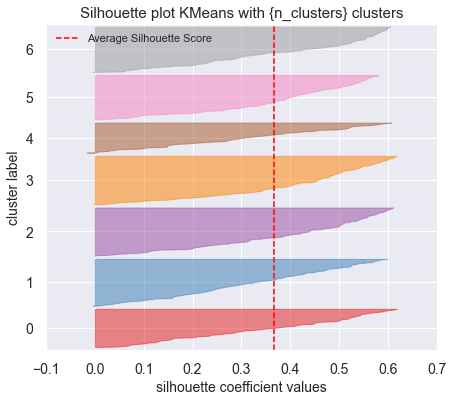

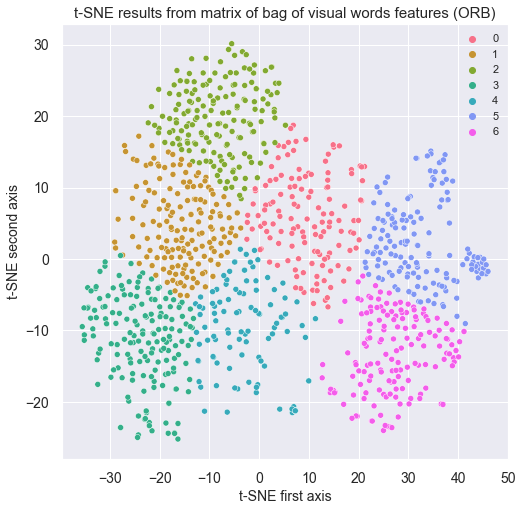

In [109]:
histograms_orb_base, kmeans_orb_base, tsne_results_orb_base = ORB_hist_tsne(img, 7, random_state=0)

Example of the histogram of the first image :

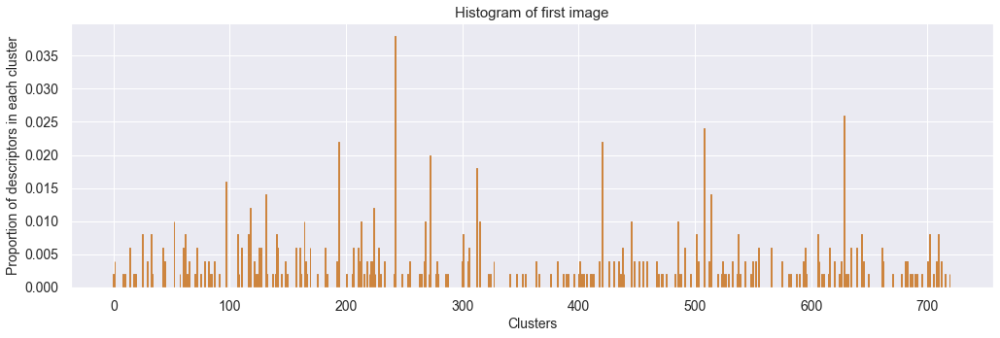

In [125]:
fig, ax = plt.subplots(figsize=(17,5))

ax.bar(x=range(0,721), height=histograms_orb_base[0], edgecolor="peru")
ax.set_title("Histogram of first image")
ax.set_xlabel("Clusters")
ax.set_ylabel("Proportion of descriptors in each cluster");

#fig.savefig("fig/histogram_ex.png", bbox_inches="tight", dpi=150);

In [221]:
#n_comp = 20

#X = histograms_df.values
#noms = histograms_df.index
#features = histograms_df.columns

# Main axes calculation
#acp = PCA(n_components=n_comp)
#acp.fit(X)

In [222]:
#display_eigenvalues(acp)

In [223]:
#histograms_reduced = acp.fit_transform(histograms_df)

In [224]:
#histograms_reduced.shape

In [225]:
categories_comparison(txt_clean, "img_kmeans_labels_orb_tsne2", kmeans_orb_base.labels_, "level_1")

Cluster 0
Home Decor & Festive Needs    29
Watches                       29
Kitchen & Dining              24
Baby Care                     15
Computers                     15
Beauty and Personal Care      12
Home Furnishing                9
Name: level_1, dtype: int64 

Cluster 1
Home Furnishing               43
Baby Care                     33
Beauty and Personal Care      24
Watches                       20
Home Decor & Festive Needs    17
Kitchen & Dining              15
Computers                     11
Name: level_1, dtype: int64 

Cluster 2
Beauty and Personal Care      42
Home Furnishing               30
Watches                       29
Home Decor & Festive Needs    27
Baby Care                     15
Computers                     14
Kitchen & Dining              11
Name: level_1, dtype: int64 

Cluster 3
Beauty and Personal Care      43
Baby Care                     29
Watches                       25
Home Furnishing               20
Kitchen & Dining              19
Computers   

In [226]:
cat_names = ["Home Decor & Festive Needs", "Home Furnishing", "Beauty and Personal Care",  "Baby Care", "Watches",
    "Kitchen & Dining", "Computers"]

clusters_to_true_labels(txt_clean, "img_kmeans_labels_orb_tsne2", "img_kmeans_labels_orb_tsne2_names", cat_names)

In [227]:
ari_orb_tsne2 = adjusted_rand_score(txt_clean["level_1"], txt_clean["img_kmeans_labels_orb_tsne2_names"])
print(f"The adjusted rand score is {ari_orb_tsne2:.2f}.")

The adjusted rand score is 0.04.


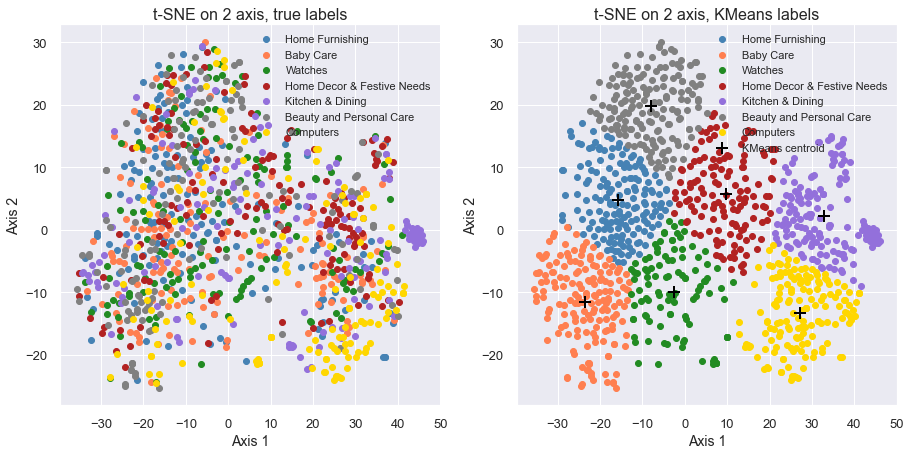

In [228]:
comparison_graph_categories_cv(tsne_results_orb_base, txt_clean["level_1"], 2, categories,
    txt_clean["img_kmeans_labels_orb_tsne2_names"], kmeans_orb_base.cluster_centers_)

Looking for better params with ORB... changing `WTA_K` and number of t-SNE components.

We have a total of 520179 descriptors. Each descriptor is a vector with 32 values.
We will use 721 clusters to group the descriptors.
Mini Batch KMeans fit time : 18.61s.
Computed 1050 histograms of length 721.
KMeans fit time : 0.09s.


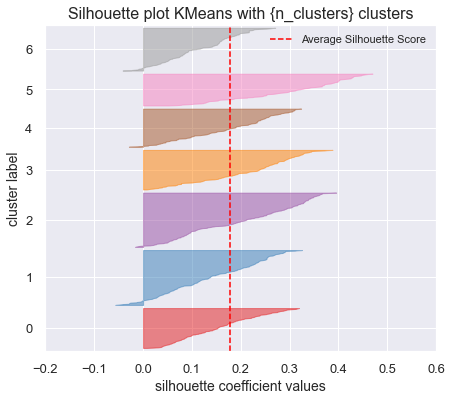

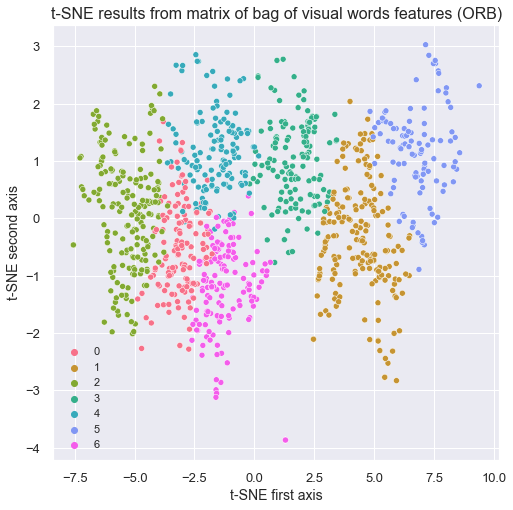

In [229]:
histo_orb_refined, kmeans_orb_refined, tsne_orb_refined = ORB_hist_tsne(img, 7, WTA_K=4, n_comp=10, method="exact", 
    learning_rate=10, perplexity=20, random_state=0)

In [230]:
categories_comparison(txt_clean, "img_kmeans_labels_orb_refined", kmeans_orb_refined.labels_, "level_1")

Cluster 0
Home Furnishing               32
Baby Care                     24
Watches                       23
Beauty and Personal Care      20
Home Decor & Festive Needs    17
Kitchen & Dining              13
Computers                     10
Name: level_1, dtype: int64 

Cluster 1
Home Decor & Festive Needs    47
Kitchen & Dining              38
Baby Care                     28
Computers                     24
Watches                       19
Beauty and Personal Care      18
Home Furnishing               17
Name: level_1, dtype: int64 

Cluster 2
Beauty and Personal Care      52
Watches                       31
Home Furnishing               30
Baby Care                     25
Home Decor & Festive Needs    24
Kitchen & Dining              14
Computers                     13
Name: level_1, dtype: int64 

Cluster 3
Watches                       34
Kitchen & Dining              25
Home Decor & Festive Needs    24
Computers                     20
Baby Care                     15
Home Furnish

In [231]:
cat_names = ["Home Furnishing", "Home Decor & Festive Needs", "Beauty and Personal Care", "Watches", "Kitchen & Dining", 
    "Computers", "Baby Care"]

clusters_to_true_labels(txt_clean, "img_kmeans_labels_orb_refined", "img_kmeans_labels_orb_refined_names", cat_names)

In [232]:
ari_orb_tsne_refined = adjusted_rand_score(txt_clean["level_1"], txt_clean["img_kmeans_labels_orb_refined_names"])
print(f"The adjusted rand score is {ari_orb_tsne_refined:.2f}.")

The adjusted rand score is 0.03.


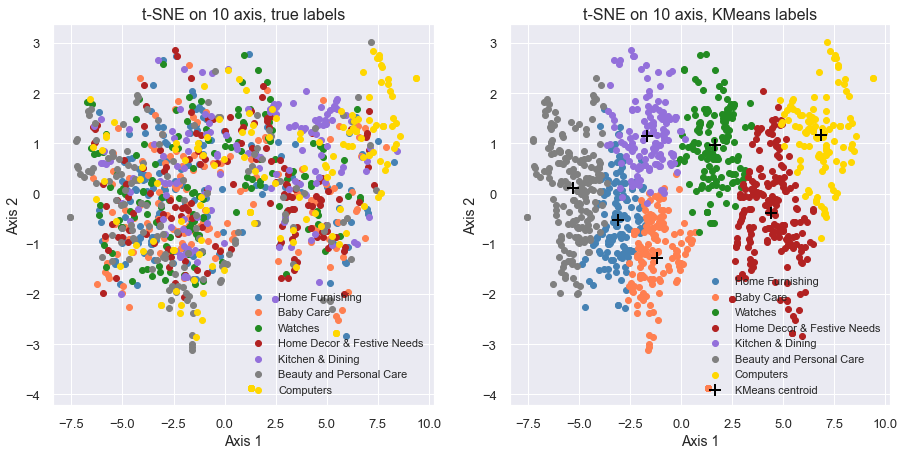

In [233]:
comparison_graph_categories_cv(tsne_orb_refined, txt_clean["level_1"], 10, categories,
    txt_clean["img_kmeans_labels_orb_refined_names"], kmeans_orb_refined.cluster_centers_)

Changing `WTA_K` back to 2 keeping 10 t-SNE components.

We have a total of 520179 descriptors. Each descriptor is a vector with 32 values.
We will use 721 clusters to group the descriptors.
Mini Batch KMeans fit time : 21.32s.
Computed 1050 histograms of length 721.
KMeans fit time : 0.09s.


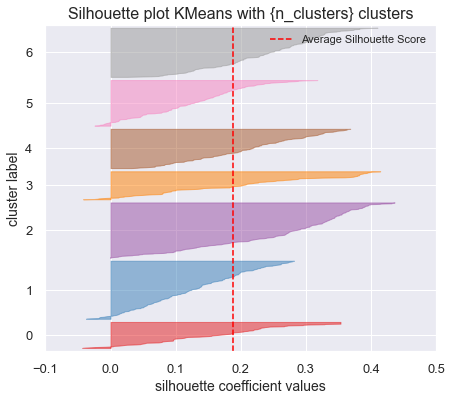

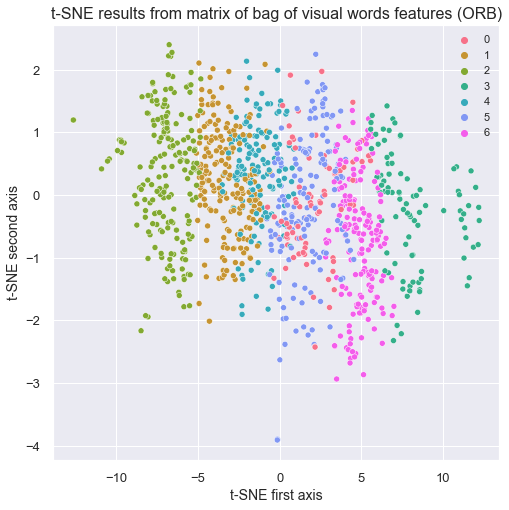

In [234]:
histo_orb_refined2, kmeans_orb_refined2, tsne_orb_refined2 = ORB_hist_tsne(img, 7, n_comp=10, method="exact", 
learning_rate=10, perplexity=20, random_state=0)

In [235]:
categories_comparison(txt_clean, "img_kmeans_labels_orb_refined2", kmeans_orb_refined2.labels_, "level_1")

Cluster 0
Watches                       21
Computers                     20
Kitchen & Dining              18
Baby Care                     12
Home Furnishing               11
Beauty and Personal Care       5
Home Decor & Festive Needs     4
Name: level_1, dtype: int64 

Cluster 1
Home Furnishing               55
Baby Care                     33
Home Decor & Festive Needs    30
Watches                       26
Kitchen & Dining              22
Beauty and Personal Care      21
Computers                     15
Name: level_1, dtype: int64 

Cluster 2
Beauty and Personal Care      46
Baby Care                     38
Watches                       29
Home Furnishing               25
Kitchen & Dining              22
Home Decor & Festive Needs    18
Computers                     14
Name: level_1, dtype: int64 

Cluster 3
Computers                     46
Kitchen & Dining              26
Home Furnishing                9
Home Decor & Festive Needs     6
Baby Care                      5
Beauty and P

In [236]:
cat_names = ["Watches", "Home Furnishing", "Baby Care", "Computers", "Beauty and Personal Care",
    "Kitchen & Dining", "Home Decor & Festive Needs"]

clusters_to_true_labels(txt_clean, "img_kmeans_labels_orb_refined2", "img_kmeans_labels_orb_refined2_names", cat_names)

In [237]:
ari_orb_tsne_refined2 = adjusted_rand_score(txt_clean["level_1"], txt_clean["img_kmeans_labels_orb_refined2_names"])
print(f"The adjusted rand score is {ari_orb_tsne_refined2:.2f}.")

The adjusted rand score is 0.03.


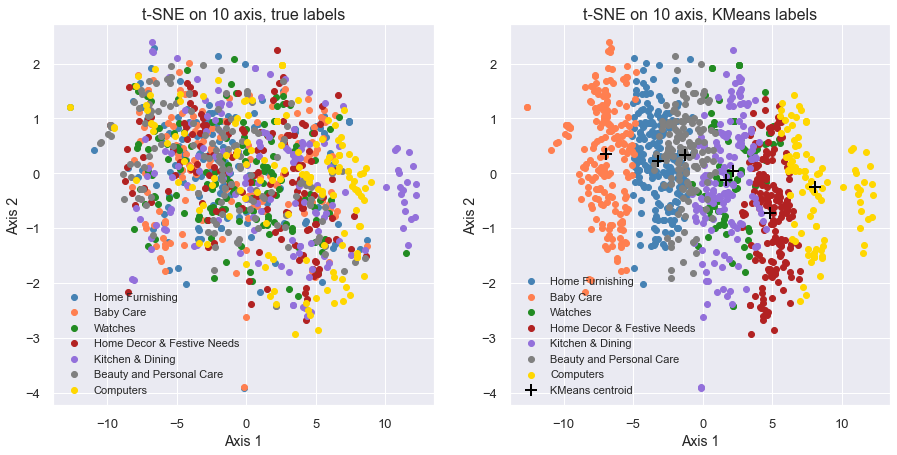

In [238]:
comparison_graph_categories_cv(tsne_orb_refined2, txt_clean["level_1"], 10, categories,
    txt_clean["img_kmeans_labels_orb_refined2_names"], kmeans_orb_refined2.cluster_centers_)

Changing `WTA_K`, `nfeatures` and number of components of t-SNE...

We have a total of 1032979 descriptors. Each descriptor is a vector with 32 values.
We will use 1016 clusters to group the descriptors.
Mini Batch KMeans fit time : 43.03s.
Computed 1050 histograms of length 1016.
KMeans fit time : 0.08s.


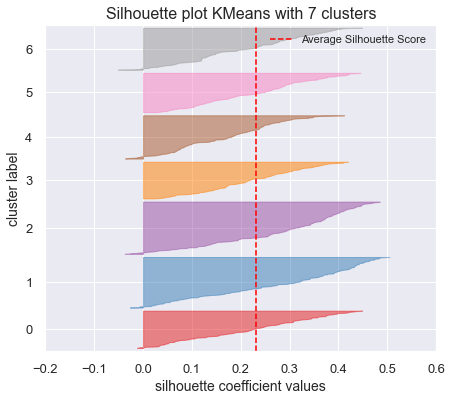

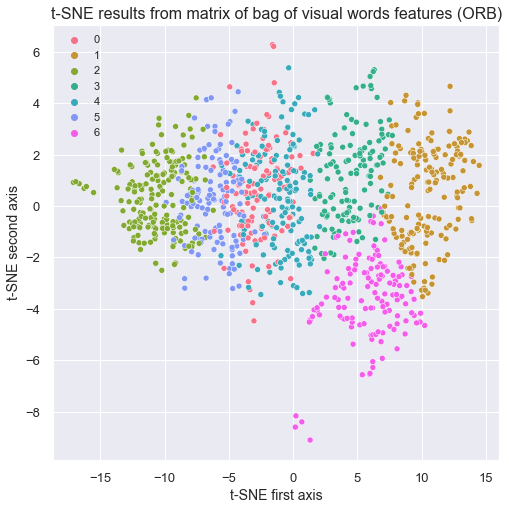

In [199]:
histo_orb_refined3, kmeans_orb_refined3, tsne_orb_refined3 = ORB_hist_tsne(img, 7, nfeatures=1000, WTA_K=3, 
n_comp=5, method="exact", learning_rate=10, random_state=0)

In [200]:
categories_comparison(txt_clean, "img_kmeans_labels_orb_refined3", kmeans_orb_refined3.labels_, "level_1")

Cluster 0
Beauty and Personal Care      36
Home Furnishing               24
Home Decor & Festive Needs    21
Watches                       21
Computers                     10
Baby Care                     10
Kitchen & Dining               8
Name: level_1, dtype: int64 

Cluster 1
Computers                     59
Kitchen & Dining              43
Home Furnishing               18
Watches                       16
Baby Care                     15
Beauty and Personal Care      13
Home Decor & Festive Needs    12
Name: level_1, dtype: int64 

Cluster 2
Beauty and Personal Care      42
Baby Care                     36
Watches                       33
Home Furnishing               20
Computers                     18
Kitchen & Dining              17
Home Decor & Festive Needs    16
Name: level_1, dtype: int64 

Cluster 3
Watches                       31
Kitchen & Dining              29
Baby Care                     19
Home Decor & Festive Needs    14
Computers                     13
Beauty and P

In [201]:
cat_names = ["Beauty and Personal Care", "Computers", "Kitchen & Dining", "Watches", "Home Furnishing", 
    "Baby Care", "Home Decor & Festive Needs"]

clusters_to_true_labels(txt_clean, "img_kmeans_labels_orb_refined3", "img_kmeans_labels_orb_refined3_names", cat_names)

In [202]:
ari_orb_tsne_refined3 = adjusted_rand_score(txt_clean["level_1"], txt_clean["img_kmeans_labels_orb_refined3_names"])
print(f"The adjusted rand score is {ari_orb_tsne_refined3:.2f}.")

The adjusted rand score is 0.04.


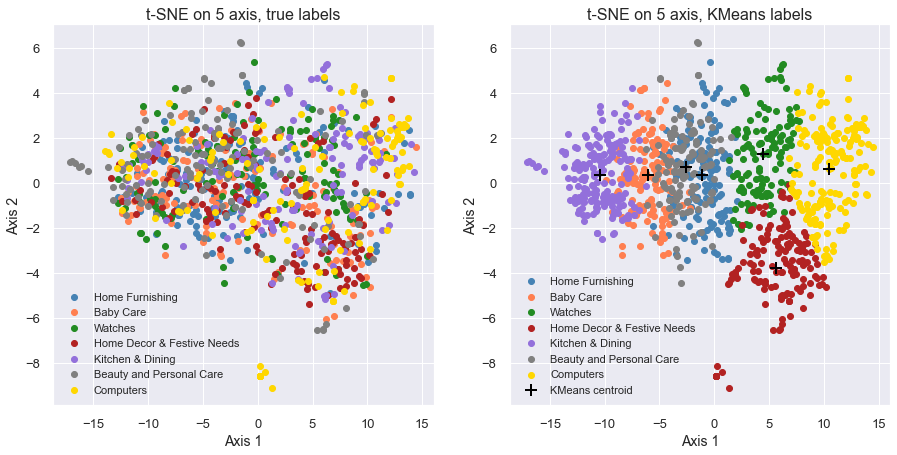

In [203]:
comparison_graph_categories_cv(tsne_orb_refined3, txt_clean["level_1"], 5, categories,
    txt_clean["img_kmeans_labels_orb_refined3_names"], kmeans_orb_refined3.cluster_centers_)

## Use both NLP and computer vision to categorized products

### With t-SNE dimensions

We will use the 3 t-SNE axis from word2vec pre-trained model and the t-SNE dimensions obtained from ORB descriptors and histograms together with a KMeans clustering.

In [244]:
nlp_cv_features = pd.concat([w2v_gn300_tsne[["axis_1", "axis_2", "axis_3"]], tsne_results_orb_base[["axis_1", "axis_2"]]], axis=1)

In [245]:
nlp_cv_features.head()

,axis_1,axis_2,axis_3,axis_1,axis_2
0,-14.79,-3.62,3.10,-9.09,14.89
1,-11.82,7.85,4.50,-25.47,8.49
2,-10.26,7.94,3.94,-9.44,4.18
3,-10.20,3.88,7.10,-14.15,18.92
4,-10.09,3.82,6.24,-17.44,1.29


In [246]:
t0 = time()
kmeans_all = KMeans(n_clusters=7,random_state=0).fit(nlp_cv_features)
t1 = time()-t0
print(f"KMeans fit time : {t1:.2f}s.")

KMeans fit time : 0.10s.


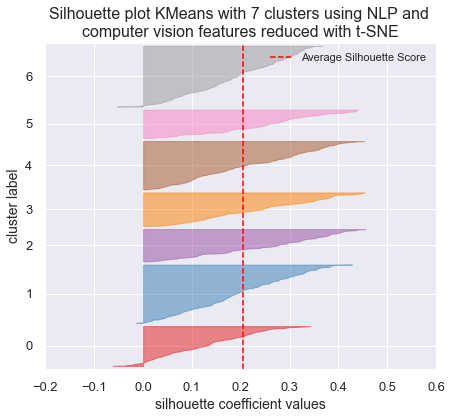

In [247]:
fig, ax = plt.subplots(figsize=(7, 6))
visualizer = SilhouetteVisualizer(KMeans(7, random_state=0),
    title='Silhouette plot KMeans with 7 clusters using NLP and \ncomputer vision features reduced with t-SNE')
visualizer.fit(nlp_cv_features)
visualizer.finalize()

In [248]:
# t_SNE dimensions reduction and visualization
tsne_results_all = TSNE(n_components=2, init="pca", learning_rate=50, n_jobs=-2, random_state=0).fit_transform(nlp_cv_features)

In [249]:
nlp_cv_features["labels"] = kmeans_all.labels_

In [250]:
tsne_results_all = pd.DataFrame(tsne_results_all)

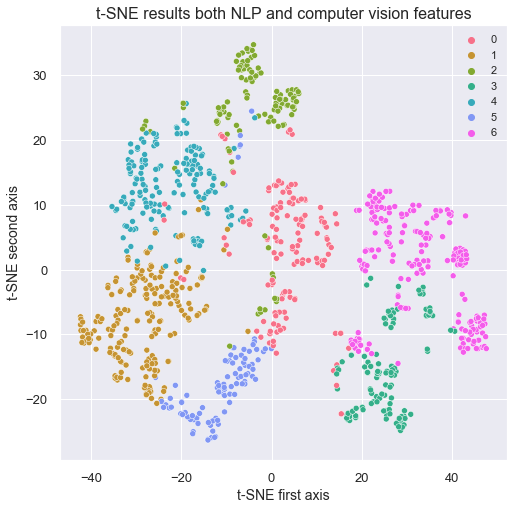

In [251]:
fig, ax = plt.subplots(figsize=(8, 8))

sns.scatterplot(ax=ax, x=tsne_results_all[0], y=tsne_results_all[1], hue=nlp_cv_features["labels"], palette=sns.color_palette("husl", 7))
ax.set_title("t-SNE results both NLP and computer vision features")
ax.set_xlabel("t-SNE first axis")
ax.set_ylabel("t-SNE second axis")
ax.legend();

In [252]:
categories_comparison(txt_clean, "nlp_img_kmeans_labels", kmeans_all.labels_, "level_1")

Cluster 0
Watches                       34
Home Decor & Festive Needs    32
Kitchen & Dining              25
Baby Care                     13
Computers                     13
Beauty and Personal Care      12
Home Furnishing               10
Name: level_1, dtype: int64 

Cluster 1
Baby Care                     66
Home Furnishing               46
Beauty and Personal Care      39
Kitchen & Dining              32
Home Decor & Festive Needs    18
Watches                        1
Computers                      1
Name: level_1, dtype: int64 

Cluster 2
Watches                       43
Beauty and Personal Care      42
Computers                     18
Kitchen & Dining               6
Home Decor & Festive Needs     2
Home Furnishing                1
Baby Care                      1
Name: level_1, dtype: int64 

Cluster 3
Computers                     74
Kitchen & Dining              19
Watches                       14
Home Decor & Festive Needs     5
Beauty and Personal Care       3
Home Furnish

In [253]:
cat_names = ["Home Decor & Festive Needs", "Baby Care", "Beauty and Personal Care", "Computers", "Home Furnishing", 
    "Watches", "Kitchen & Dining"]

clusters_to_true_labels(txt_clean, "nlp_img_kmeans_labels", "nlp_img_kmeans_labels_names", cat_names)

In [254]:
ari_all = adjusted_rand_score(txt_clean["level_1"], txt_clean["nlp_img_kmeans_labels_names"])
print(f"The adjusted rand score is {ari_all:.2f}.")

The adjusted rand score is 0.12.


### Using raw NLP and computer vision features

We will merge word-embedding features (mean documents vectors) and images histograms.

In [255]:
best_raw_features = pd.concat([pd.DataFrame(all_doc_vec_gn300), pd.DataFrame(histograms_orb_base)], axis=1)
best_raw_features

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,...,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720
0,0.04,0.05,-0.01,0.03,-0.03,-0.05,0.10,-0.14,0.07,0.13,-0.07,-0.11,0.04,-0.06,-0.09,0.05,0.04,0.07,0.01,-0.10,0.03,0.03,-0.02,0.04,0.00,-0.00,-0.03,0.11,0.05,-0.08,-0.07,0.04,0.00,0.02,-0.03,-0.09,0.05,0.05,-0.03,0.06,0.03,-0.01,0.04,-0.01,-0.02,-0.09,-0.09,0.03,0.09,0.07,-0.05,0.04,-0.02,-0.06,0.06,-0.00,0.00,-0.05,0.05,-0.05,-0.07,-0.01,-0.09,-0.12,0.03,-0.01,-0.13,0.10,0.06,0.17,0.14,0.02,0.07,-0.07,-0.13,-0.05,0.12,0.03,0.05,0.06,0.07,-0.04,-0.05,-0.03,-0.02,0.00,-0.08,0.09,0.02,0.05,-0.01,0.02,-0.07,0.01,-0.06,-0.05,-0.00,-0.08,0.02,-0.07,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,0.03,0.07,0.02,0.07,-0.00,0.04,0.05,-0.21,0.05,0.11,-0.04,-0.19,0.02,-0.04,-0.16,0.02,-0.12,0.05,-0.01,-0.09,0.04,0.06,0.01,0.00,-0.00,0.04,-0.10,0.11,0.05,-0.12,-0.03,0.05,0.00,-0.00,-0.06,0.06,0.08,0.02,-0.03,0.05,-0.02,-0.01,0.10,-0.00,-0.03,-0.16,-0.07,-0.04,0.02,-0.01,0.02,0.05,-0.06,-0.08,0.02,-0.01,0.07,-0.03,0.03,-0.00,-0.04,0.04,-0.07,-0.07,0.06,0.00,-0.14,0.04,0.07,0.15,0.23,0.07,0.08,0.01,-0.13,-0.00,0.12,-0.03,0.10,0.10,0.06,-0.10,-0.03,0.05,0.01,0.03,0.02,0.13,0.11,0.06,-0.02,0.02,-0.09,-0.04,-0.06,-0.05,-0.00,-0.04,0.14,0.04,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,0.02,0.10,-0.00,0.07,-0.01,0.05,0.09,-0.11,0.08,0.13,-0.06,-0.14,-0.03,-0.00,-0.12,0.06,-0.06,0.12,-0.02,-0.09,-0.02,0.03,0.03,0.04,0.04,0.00,-0.09,0.08,0.02,-0.08,-0.06,0.04,-0.01,-0.00,-0.06,0.04,0.05,0.03,0.01,0.07,0.01,0.00,0.08,-0.02,-0.06,-0.14,-0.04,-0.01,0.04,0.01,0.01,0.03,-0.08,-0.07,0.01,-0.02,0.04,-0.04,0.04,-0.03,-0.04,0.02,-0.09,-0.13,0.04,0.00,-0.13,0.05,0.09,0.12,0.13,0.03,0.09,0.03,-0.16,-0.05,0.11,0.03,0.06,0.07,0.01,-0.10,-0.01,0.04,0.04,0.00,-0.03,0.14,0.04,0.07,-0.01,0.01,-0.05,-0.04,-0.05,-0.09,0.02,-0.02,0.07,-0.03,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,0.00,0.04,-0.04,0.08,-0.01,-0.02,0.08,-0.14,0.07,0.09,-0.04,-0.18,0.02,0.04,-0.14,0.02,0.00,0.05,-0.01,-0.07,-0.00,-0.00,-0.02,0.03,0.04,-0.02,-0.1

We have 1021 features. We need to scale our features first.

In [256]:
raw_features_scaled = StandardScaler().fit_transform(best_raw_features)

In [257]:
t0 = time()
kmeans_raw_features = KMeans(n_clusters=7,random_state=0).fit(raw_features_scaled)
t1 = time()-t0
print(f"KMeans fit time : {t1:.2f}s.")

KMeans fit time : 0.37s.


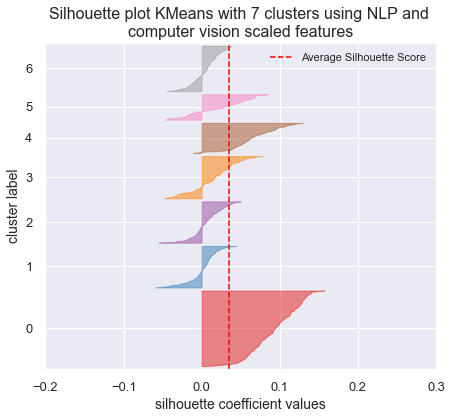

In [258]:
fig, ax = plt.subplots(figsize=(7, 6))
visualizer = SilhouetteVisualizer(KMeans(7, random_state=0),
    title='Silhouette plot KMeans with 7 clusters using NLP and \ncomputer vision scaled features')
visualizer.fit(raw_features_scaled)
visualizer.finalize()

In [259]:
# t_SNE dimensions reduction and visualization
tsne_results_raw_features = TSNE(n_components=2, init="pca", learning_rate=50, n_jobs=-2, random_state=0).fit_transform(raw_features_scaled)

In [260]:
tsne_results_raw_features = pd.DataFrame(tsne_results_raw_features)

In [261]:
tsne_results_raw_features["kmeans_labels"] = kmeans_raw_features.labels_

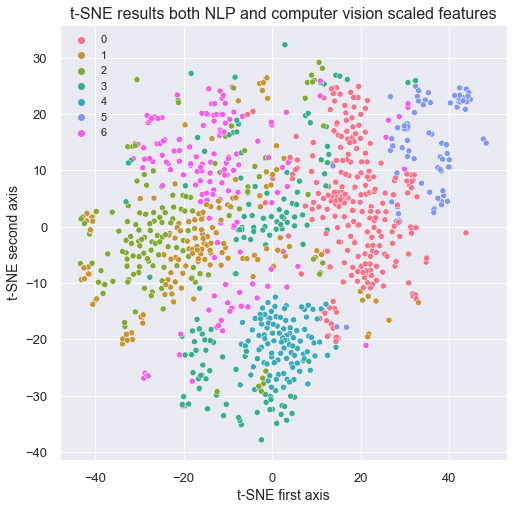

In [262]:
fig, ax = plt.subplots(figsize=(8, 8))

sns.scatterplot(ax=ax, x=tsne_results_raw_features[0], y=tsne_results_raw_features[1], 
    hue=tsne_results_raw_features["kmeans_labels"], palette=sns.color_palette("husl", 7))
ax.set_title("t-SNE results both NLP and computer vision scaled features")
ax.set_xlabel("t-SNE first axis")
ax.set_ylabel("t-SNE second axis")
ax.legend();

In [263]:
categories_comparison(txt_clean, "nlp_img_raw_kmeans_labels", kmeans_raw_features.labels_, "level_1")

Cluster 0
Kitchen & Dining              69
Home Decor & Festive Needs    58
Baby Care                     42
Home Furnishing               29
Beauty and Personal Care      25
Computers                     20
Watches                       19
Name: level_1, dtype: int64 

Cluster 1
Home Furnishing               63
Baby Care                     58
Home Decor & Festive Needs    12
Kitchen & Dining               9
Beauty and Personal Care       3
Name: level_1, dtype: int64 

Cluster 2
Home Furnishing               51
Home Decor & Festive Needs    31
Baby Care                     29
Beauty and Personal Care      15
Kitchen & Dining               8
Watches                        5
Computers                      5
Name: level_1, dtype: int64 

Cluster 3
Beauty and Personal Care      52
Home Decor & Festive Needs    28
Kitchen & Dining              25
Watches                       19
Computers                     16
Baby Care                      5
Home Furnishing                2
Name: level_

In [264]:
cat_names = ["Kitchen & Dining", "Baby Care", "Home Furnishing", "Home Decor & Festive Needs", "Watches", "Computers",  
    "Beauty and Personal Care"]

clusters_to_true_labels(txt_clean, "nlp_img_raw_kmeans_labels", "nlp_img_raw_kmeans_labels_names", cat_names)

In [265]:
ari_all = adjusted_rand_score(txt_clean["level_1"], txt_clean["nlp_img_raw_kmeans_labels_names"])
print(f"The adjusted rand score is {ari_all:.2f}.")

The adjusted rand score is 0.19.


With a PCA before KMeans...

In [277]:
raw_features_scaled_df = pd.DataFrame(raw_features_scaled)

In [278]:
n_comp = 600

X = raw_features_scaled_df.values
noms = raw_features_scaled_df.index
features = raw_features_scaled_df.columns

# Main axes calculation
acp = PCA(n_components=n_comp)
acp.fit(X)

PCA(n_components=600)

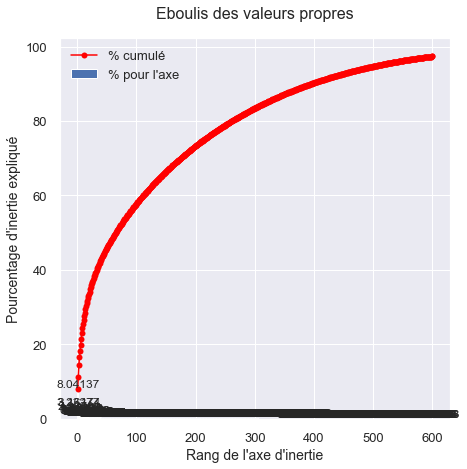

In [279]:
display_eigenvalues(acp, annotate=False)

We will keep coordinates on 600 PCA axis as features, which give us close to 99% of the original information.

In [280]:
raw_features_reduced = acp.transform(raw_features_scaled_df)

In [281]:
pd.DataFrame(raw_features_reduced)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,...,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599
0,-6.92,7.04,1.95,2.77,-0.31,-1.67,-4.87,0.67,0.46,3.89,-4.09,-1.97,2.68,3.19,0.04,-0.47,-1.80,-3.38,4.48,-0.51,1.03,-2.19,-0.18,0.80,-1.54,-3.89,-2.21,0.20,-3.13,-0.35,4.74,-0.88,-3.27,-3.56,0.15,1.37,1.20,-0.48,-2.09,-1.44,-2.87,2.03,0.29,2.19,-0.04,-0.95,0.79,0.59,2.22,4.63,1.67,3.46,0.09,2.83,0.29,1.03,4.06,-4.07,-1.96,-0.18,-1.49,-3.81,4.61,1.75,-0.55,3.74,-0.44,0.81,0.94,0.39,0.33,3.84,-3.45,0.39,-2.39,-4.04,8.10,3.61,-1.07,2.39,2.12,-0.74,-0.41,0.57,1.31,-0.43,-1.86,4.88,-3.14,-0.99,-1.82,-4.35,-1.35,-0.61,-1.36,-2.06,0.51,-0.30,0.01,-0.31,...,0.27,0.15,0.06,0.38,0.89,0.50,0.08,0.86,1.28,-0.07,0.46,0.02,0.02,-0.17,-0.30,-0.94,-0.56,0.32,-0.66,0.38,0.09,-0.41,0.04,-0.83,0.86,0.76,0.00,-0.58,-0.93,-0.17,0.06,0.75,0.30,-0.20,0.41,-0.14,0.15,0.14,-0.23,0.46,0.27,-0.78,-0.21,0.09,0.02,-0.37,1.07,-0.70,0.39,-0.11,0.27,0.16,0.33,0.04,-0.06,0.38,0.38,0.77,-0.61,0.33,0.10,-0.95,0.29,-0.58,0.28,-0.32,-0.34,-0.38,0.02,0.64,0.40,0.13,-0.51,0.00,0.37,-0.34,0.11,0.21,-0.54,0.53,-0.18,-0.19,0.15,0.80,0.47,0.39,-0.41,-0.12,-0.05,0.36,0.48,0.75,-0.06,0.56,-0.03,-0.13,-0.81,0.28,0.10,-0.19
1,-8.81,1.81,7.41,4.28,0.98,-0.27,4.51,-3.61,-0.45,-1.11,-3.89,0.09,-0.46,4.11,1.39,1.68,-0.68,-4.75,2.86,-0.46,-0.41,-4.52,-1.55,0.08,-0.53,-0.72,-1.79,2.04,0.90,-0.05,-1.75,1.07,1.56,-3.80,-1.41,-1.96,-2.49,0.58,-2.46,-2.40,1.76,-1.85,-0.24,-1.80,3.34,-0.92,0.44,-0.10,-0.54,1.85,-2.82,0.59,2.58,3.13,-1.49,-0.46,-0.21,1.04,-2.32,3.01,-2.10,1.84,0.76,-0.53,-0.68,-0.07,-2.18,0.18,-0.42,-1.10,1.35,-0.64,-1.73,-0.47,0.33,0.41,0.38,0.94,-0.10,0.45,0.30,-0.91,-1.15,-1.95,1.79,-0.32,1.02,0.55,-1.38,0.59,1.78,-0.53,1.07,2.06,-0.11,-0.05,1.77,0.91,0.58,-0.98,...,0.47,-0.20,0.25,0.22,0.52,0.41,0.35,0.18,-0.02,-0.36,-0.57,0.19,0.09,0.77,0.41,-0.53,0.18,-0.16,0.16,-0.90,0.08,0.21,-0.63,-0.63,-0.01,0.08,0.47,0.30,0.60,-0.75,0.69,0.60,-0.86,0.36,-0.05,-0.36,0.14,-0.96,-0.40,-0.30,0.13,0.98,-0.50,0.48,0.66,0.45,-0.04,-0.11,0.60,0.33,0.64,-0.74,-0.10,-0.09,0.39,0.44,-0.14,-0.38,-0.27,-0.50,0.42,0.15,0.43,-1.04,0.39,-0.94,-0.24,-0.09,0.05,-0.50,-0.66,-0.40,-0.56,-0.23,-0.37,-0.25,-0.58,-0.25,-0.43,1.16,0.44,0.62,0.56,0.04,-0.61,-0.57,0.44,-0.34,0.11,-0.19,-0.05,-0.60,0.44,-0.61,-0.83,0.08,0.34,0.04,-0.34,-0.45
2,-7.63,-3.80,3.74,0.19,0.19,0.05,-0.48,-2.77,5.35,6.50,-1.74,0.82,-3.52,1.12,-3.78,-2.07,2.23,-2.40,-3.97,-4.95,-5.53,-5.31,-2.99,-6.85,-4.53,1.92,-5.66,3.87,-2.61,0.42,-5.16,-2.79,7.70,7.65,-6.03,-0.22,-2.89,9.90,5.76,8.87,2.38,-3.41,5.81,-1.91,-10.74,3.57,2.19,-4.41,-1.71,3.68,5.95,6.46,0.54,2.76,-1.87,2.72,0.83,6.16,-1.75,8.88,0.08,-1.48,0.63,2.69,-1.72,7.88,-3.74,2.95,-3.78,2.51,0.22,0.33,0.95,-0.15,-4.54,-3.07,4.85,-2.54,2.46,-2.29,-3.04,2.27,-4.15,3.13,-4.62,1.66,2.56,0.42,4.66,0.08,1.84,-1.88,2.46,-3.77,0.43,-0.69,-3.01,-1.32,-1.44,-3.36,...,0.09,0.03,0.38,0.36,-0.03,-0.18,-0.47,0.04,-0.33,0.06,0.83,-0.48,-0.28,0.53,0.08,-0.13,-0.56,0.30,0.34,-0.17,-0.33,-0.10,0.23,-0.31,0.39,0.12,-0.04,0.05,0.49,0.23,0.23,-0.40,-0.10,0.02,-0.15,0.62,0.66,0.71,0.31,0.01,-0.17,-0.19,0.02,-0.61,0.12,0.35,-0.59,-0.17,0.25,0.45,-0.09,0.29,-0.30,0.28,0.10,-0.39,-0.36,0.54,0.39,0.31,-0.06,0.30,0.00,0.23,-0.75,-0.09,-0.05,-0.04,-0.04,-0.27,-0.13,0.06,0.59,-0.18,-0.02,0.27,0.37,-0.23,-0.05,0.24,0.23,0.51,-0.26,-0.16,-0.43,0.29,0.23,0.20,-0.53,0.19,-0.11,-0.33,0.03,-0.32,-0.53,-0.44,0.17,0.03,-0.28

In [282]:
t0 = time()
kmeans_raw_features_reduced = KMeans(n_clusters=7,random_state=0).fit(raw_features_reduced)
t1 = time()-t0
print(f"KMeans fit time : {t1:.2f}s.")

KMeans fit time : 0.26s.


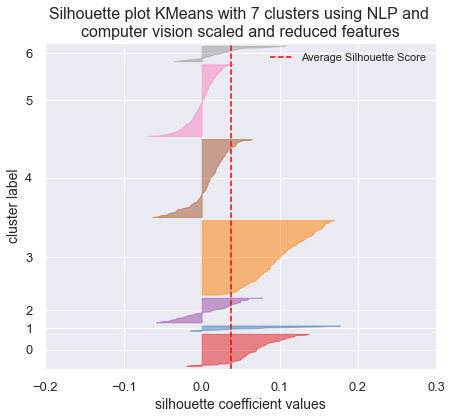

In [283]:
fig, ax = plt.subplots(figsize=(7, 6))
visualizer = SilhouetteVisualizer(KMeans(7, random_state=0),
    title='Silhouette plot KMeans with 7 clusters using NLP and \ncomputer vision scaled and reduced features')
visualizer.fit(raw_features_reduced)
visualizer.finalize()

In [284]:
# t_SNE dimensions reduction and visualization
tsne_results_raw_features_reduced = TSNE(n_components=2, init="pca", learning_rate=50, n_jobs=-2, random_state=0).fit_transform(raw_features_reduced)

In [285]:
tsne_results_raw_features_reduced = pd.DataFrame(tsne_results_raw_features_reduced)

In [286]:
tsne_results_raw_features_reduced["kmeans_labels"] = kmeans_raw_features_reduced.labels_

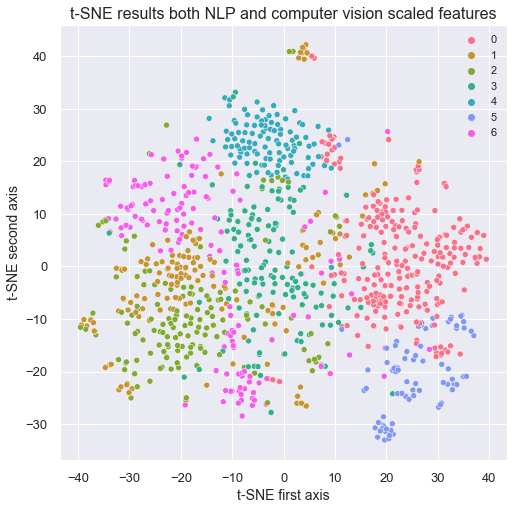

In [287]:
fig, ax = plt.subplots(figsize=(8, 8))

sns.scatterplot(ax=ax, x=tsne_results_raw_features_reduced[0], y=tsne_results_raw_features_reduced[1], 
    hue=tsne_results_raw_features["kmeans_labels"], palette=sns.color_palette("husl", 7))
ax.set_title("t-SNE results both NLP and computer vision scaled features")
ax.set_xlabel("t-SNE first axis")
ax.set_ylabel("t-SNE second axis")
ax.legend();

In [288]:
categories_comparison(txt_clean, "nlp_img_raw_reduced_kmeans_labels", kmeans_raw_features_reduced.labels_, "level_1")

Cluster 0
Watches                       110
Home Decor & Festive Needs      2
Name: level_1, dtype: int64 

Cluster 1
Home Furnishing    11
Baby Care           8
Name: level_1, dtype: int64 

Cluster 2
Computers                     80
Kitchen & Dining               4
Home Decor & Festive Needs     1
Beauty and Personal Care       1
Name: level_1, dtype: int64 

Cluster 3
Kitchen & Dining              70
Home Decor & Festive Needs    44
Baby Care                     42
Home Furnishing               30
Beauty and Personal Care      28
Computers                     23
Watches                       22
Name: level_1, dtype: int64 

Cluster 4
Home Furnishing               70
Beauty and Personal Care      67
Home Decor & Festive Needs    36
Kitchen & Dining              35
Baby Care                     33
Computers                     17
Watches                       13
Name: level_1, dtype: int64 

Cluster 5
Baby Care                     67
Beauty and Personal Care      53
Home Furnishing   

In [289]:
cat_names = ["Watches", "Home Furnishing", "Computers", "Kitchen & Dining", "Beauty and Personal Care", 
    "Baby Care", "Home Decor & Festive Needs"]

clusters_to_true_labels(txt_clean, "nlp_img_raw_reduced_kmeans_labels", "nlp_img_raw_reduced_kmeans_labels_names", cat_names)

In [290]:
ari_raw_reduced = adjusted_rand_score(txt_clean["level_1"], txt_clean["nlp_img_raw_reduced_kmeans_labels"])
print(f"The adjusted rand score is {ari_raw_reduced:.2f}.")

The adjusted rand score is 0.15.


Not better with CPA before...